# Round 2 results
After partial diffusion from selected backbones

| Metric | Round1 | Round2 | Change |
|---|---|---|---|
| Total designs | 2480 | 9520 | 3.8x |
| ipAE < 5 | 2 (0.08%) | 88 (0.92%) | 44x |
| Pass all filters | 18 (0.73%) | 402 (4.2%) | 5.8x |
| Backbones with >=1 pass | 15/310 (4.8%) | 190/1190 (16.0%) | 3.3× |

The hit rate improvement is not just from having more designs — the per-sequence hit rate went from 0.73% to 4.2%, meaning partial diffusion genuinely produced better backbones, not just more of them.

**What the pAE distribution tells you**

The mean pAE dropped from 26.3 (Round 1) to 25.1 (Round 2), and the std increased from 2.4 to 4.6. That wider distribution is the key signal — partial diffusion is producing a heavier tail of high-quality designs. The 88 designs at pAE < 5 versus only 2 in Round 1 is a dramatic improvement, and several of the top candidates are at pAE 3.6–3.8, which is genuinely excellent and approaching the mart1-3 positive control range.

**Top candidates are exceptional**

The top 5 designs all have pAE < 3.9, pLDDT > 95.8, binder RMSD < 0.62 Å, and target RMSD < 1.25 Å. Those are by any measure high-confidence predictions — the binder folds as designed and the complex geometry is well-predicted. orient_255_pT12__88_sample08 at pAE=3.648 is your best design so far across both rounds.

**Backbone-level signals**
orient_255 and orient_252 are dominating the top hits — orient_255 appears 6 times in the top 20 and orient_252 appears 7 times. These are your two most productive scaffolds. Notably, orient_255 was already one of the top Round 1 backbones (pAE=5.197), and partial diffusion has amplified its productivity substantially. This is exactly the scaffold recycling effect the paper describes.

The per-backbone distribution (95 backbones with exactly 1 passing seq, down to 1 backbone with 8 passing seqs) is also healthy — a small number of highly productive scaffolds and a long tail of marginal ones, which is typical.

**target_aligned_rmsd is worth watching**

The target RMSD filter at < 5 Å is quite permissive — only 3.5% of designs pass < 2 Å. This likely reflects the fact that chain B (MHC+peptide merged) has more conformational flexibility in the AF2 prediction than in Round 1, where the complex was better constrained. It's not necessarily a problem for the top candidates (which have target RMSD 0.6–2.1 Å), but worth keeping an eye on as you tighten filters downstream.

**What to do next**
With 190 surviving backbones and 402 passing designs, you're in a comfortable position. A few options in order of priority:
1. Deep MPNN mining on top backbones — orient_255 and orient_252 variants are the obvious targets. Running 32–50 sequences per backbone at T=0.1 and 0.2 on the top ~20–30 backbones (those with ≥3 passing sequences) would be the highest-yield next step.
2. Tighten the filter — apply ~pAE < 5~ ipSAE >= 0.8 as the primary filter to focus on the ~88~199 genuinely strong candidates before investing more compute.
3. Consider the ProteinMPNN specificity scoring (alanine scan) mentioned in the paper as the next in-silico filter after AF2 initial guess, to prioritize designs that are specifically reading out the G12D mutation.

## Calculate ipSAE

In [1]:
import sys
import glob
from pathlib import Path
from collections import OrderedDict
import pandas as pd
from scipy.stats import spearmanr

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 120

# Add the directory containing pmhci_ipsae.py and pae_cutoff_analysis.py
# to the path. Edit this if your scripts are elsewhere.
SCRIPT_DIR = Path(".")   # <-- update if needed
sys.path.insert(0, str(SCRIPT_DIR))

from calc_ipsae import (
    load_pae_matrix, build_chain_slices,
    chain_lengths_from_pdb, score_binder_peptide_ipsae, print_summary,
)

print("Imports OK")

Imports OK


In [22]:
PAE_DIR  = Path("/n/groups/marks/users/aaron/pmhc/af_init_guess/outputs/r2/af2_kras/pae")
PDB_DIR  = Path("/n/groups/marks/users/aaron/pmhc/af_init_guess/inputs/r2/threaded_pdbs")

NOMINAL_CUTOFF = 12.0   # Angstroms
DIST_CUTOFF    = 8.0    # Cα distance threshold for crystal contacts (Angstroms)
PEPTIDE_LEN = 9 # VVGADGVGK

In [3]:
# ── Discover design PAE + PDB pairs ─────────────────────────────────────────
npy_files = sorted(PAE_DIR.glob("*_pae.npy"))
pdb_files = []
for npy in npy_files:
    # Corresponding PDB: strip _pae.npy suffix, add .pdb
    stem = npy.stem.replace("_af2pred_pae", "")
    pdb  = PDB_DIR / f"{stem}.pdb"
    pdb_files.append(str(pdb) if pdb.exists() else None)

labels = [Path(n).stem.replace("_pae", "") for n in npy_files]

print(f"Found {len(npy_files)} PAE files")
print(f"  PDB matched: {sum(p is not None for p in pdb_files)} / {len(npy_files)}")
for npy, pdb, label in zip(npy_files, pdb_files, labels):
    pdb_ok = "✓" if pdb else "✗ (no PDB)"
    print(f"  {label:<50s} {pdb_ok}")

Found 9520 PAE files
  PDB matched: 9520 / 9520
  orient_158_pT12__0_sample01_af2pred                ✓
  orient_158_pT12__0_sample02_af2pred                ✓
  orient_158_pT12__0_sample03_af2pred                ✓
  orient_158_pT12__0_sample04_af2pred                ✓
  orient_158_pT12__0_sample05_af2pred                ✓
  orient_158_pT12__0_sample06_af2pred                ✓
  orient_158_pT12__0_sample07_af2pred                ✓
  orient_158_pT12__0_sample08_af2pred                ✓
  orient_158_pT12__10_sample01_af2pred               ✓
  orient_158_pT12__10_sample02_af2pred               ✓
  orient_158_pT12__10_sample03_af2pred               ✓
  orient_158_pT12__10_sample04_af2pred               ✓
  orient_158_pT12__10_sample05_af2pred               ✓
  orient_158_pT12__10_sample06_af2pred               ✓
  orient_158_pT12__10_sample07_af2pred               ✓
  orient_158_pT12__10_sample08_af2pred               ✓
  orient_158_pT12__11_sample01_af2pred               ✓
  orient_158_pT12

In [4]:
# ── Quick ipSAE summary table at the nominal cutoff ─────────────────────────
print(f"{'Design':<50s} {'binder':>7} {'MHC':>5} {'pep':>4} {'ipSAE':>7} {'n_contacts':>11} {'mean_PAE':>9}")
print("─" * 100)

results_table = []
for npy, pdb, label in zip(npy_files, pdb_files, labels):
    try:
        cl = chain_lengths_from_pdb(pdb, peptide_length=PEPTIDE_LEN) if pdb else None
        if cl is None:
            print(f"  {label}: no PDB, skipping")
            continue
        r = score_binder_peptide_ipsae(str(npy), cl, pae_cutoff=NOMINAL_CUTOFF)
        results_table.append({"label": label, "chain_lengths": cl, **r})
        print(f"  {label:<48s} {cl['binder']:>7} {cl['MHC']:>5} {cl['peptide']:>4} "
              f"  {r['ipsae_binder_peptide']:>6.4f}  {r['n_contacts']:>10}  {r['mean_pae_bp']:>8.2f} Å")
    except Exception as e:
        print(f"  {label}: ERROR — {e}")

print(f"\nScored {len(results_table)} designs at PAE cutoff = {NOMINAL_CUTOFF} Å")

results_df = pd.DataFrame(results_table)

Design                                              binder   MHC  pep   ipSAE  n_contacts  mean_PAE
────────────────────────────────────────────────────────────────────────────────────────────────────
  orient_158_pT12__0_sample01_af2pred                   58   178    9   0.3946         408     10.34 Å
  orient_158_pT12__0_sample02_af2pred                   58   178    9   0.0000           0     24.83 Å
  orient_158_pT12__0_sample03_af2pred                   58   178    9   0.0023           2     20.04 Å
  orient_158_pT12__0_sample04_af2pred                   58   178    9   0.0000           0     26.17 Å
  orient_158_pT12__0_sample05_af2pred                   58   178    9   0.1499         126     17.54 Å
  orient_158_pT12__0_sample06_af2pred                   58   178    9   0.0000           0     24.54 Å
  orient_158_pT12__0_sample07_af2pred                   58   178    9   0.0000           0     24.17 Å
  orient_158_pT12__0_sample08_af2pred                   58   178    9   0.0000

  orient_158_pT12__19_sample08_af2pred                  58   178    9   0.0000           0     26.74 Å
  orient_158_pT12__1_sample01_af2pred                   58   178    9   0.0000           0     27.49 Å
  orient_158_pT12__1_sample02_af2pred                   58   178    9   0.0000           0     25.33 Å
  orient_158_pT12__1_sample03_af2pred                   58   178    9   0.0000           0     25.73 Å
  orient_158_pT12__1_sample04_af2pred                   58   178    9   0.0000           0     24.81 Å
  orient_158_pT12__1_sample05_af2pred                   58   178    9   0.0000           0     24.02 Å
  orient_158_pT12__1_sample06_af2pred                   58   178    9   0.0000           0     25.36 Å
  orient_158_pT12__1_sample07_af2pred                   58   178    9   0.0000           0     27.16 Å
  orient_158_pT12__1_sample08_af2pred                   58   178    9   0.0000           0     27.64 Å
  orient_158_pT12__20_sample01_af2pred                  58   178    9   0

  orient_158_pT12__29_sample03_af2pred                  58   178    9   0.3950         349     10.71 Å
  orient_158_pT12__29_sample04_af2pred                  58   178    9   0.0000           0     21.79 Å
  orient_158_pT12__29_sample05_af2pred                  58   178    9   0.0000           0     28.29 Å
  orient_158_pT12__29_sample06_af2pred                  58   178    9   0.0000           0     25.00 Å
  orient_158_pT12__29_sample07_af2pred                  58   178    9   0.0760          65     16.71 Å
  orient_158_pT12__29_sample08_af2pred                  58   178    9   0.0000           0     24.06 Å
  orient_158_pT12__2_sample01_af2pred                   58   178    9   0.0000           0     28.94 Å
  orient_158_pT12__2_sample02_af2pred                   58   178    9   0.0000           0     24.10 Å
  orient_158_pT12__2_sample03_af2pred                   58   178    9   0.0000           0     27.23 Å
  orient_158_pT12__2_sample04_af2pred                   58   178    9   0

  orient_158_pT12__39_sample02_af2pred                  58   178    9   0.0000           0     28.41 Å
  orient_158_pT12__39_sample03_af2pred                  58   178    9   0.0000           0     29.28 Å
  orient_158_pT12__39_sample04_af2pred                  58   178    9   0.0000           0     24.32 Å
  orient_158_pT12__39_sample05_af2pred                  58   178    9   0.0000           0     26.30 Å
  orient_158_pT12__39_sample06_af2pred                  58   178    9   0.0000           0     25.46 Å
  orient_158_pT12__39_sample07_af2pred                  58   178    9   0.0000           0     23.72 Å
  orient_158_pT12__39_sample08_af2pred                  58   178    9   0.0000           0     28.01 Å
  orient_158_pT12__3_sample01_af2pred                   58   178    9   0.0000           0     24.43 Å
  orient_158_pT12__3_sample02_af2pred                   58   178    9   0.0000           0     26.13 Å
  orient_158_pT12__3_sample03_af2pred                   58   178    9   0

  orient_158_pT12__48_sample03_af2pred                  58   178    9   0.0000           0     21.58 Å
  orient_158_pT12__48_sample04_af2pred                  58   178    9   0.0000           0     24.82 Å
  orient_158_pT12__48_sample05_af2pred                  58   178    9   0.0000           0     24.76 Å
  orient_158_pT12__48_sample06_af2pred                  58   178    9   0.0000           0     26.81 Å
  orient_158_pT12__48_sample07_af2pred                  58   178    9   0.0000           0     27.04 Å
  orient_158_pT12__48_sample08_af2pred                  58   178    9   0.0000           0     26.18 Å
  orient_158_pT12__49_sample01_af2pred                  58   178    9   0.0000           0     27.21 Å
  orient_158_pT12__49_sample02_af2pred                  58   178    9   0.0000           0     25.87 Å
  orient_158_pT12__49_sample03_af2pred                  58   178    9   0.0000           0     24.90 Å
  orient_158_pT12__49_sample04_af2pred                  58   178    9   0

  orient_158_pT12__58_sample04_af2pred                  58   178    9   0.0000           0     26.34 Å
  orient_158_pT12__58_sample05_af2pred                  58   178    9   0.0000           0     25.48 Å
  orient_158_pT12__58_sample06_af2pred                  58   178    9   0.0000           0     26.79 Å
  orient_158_pT12__58_sample07_af2pred                  58   178    9   0.0000           0     24.84 Å
  orient_158_pT12__58_sample08_af2pred                  58   178    9   0.0000           0     26.73 Å
  orient_158_pT12__59_sample01_af2pred                  58   178    9   0.0000           0     24.33 Å
  orient_158_pT12__59_sample02_af2pred                  58   178    9   0.0019           4     20.26 Å
  orient_158_pT12__59_sample03_af2pred                  58   178    9   0.0000           0     23.45 Å
  orient_158_pT12__59_sample04_af2pred                  58   178    9   0.0000           0     26.26 Å
  orient_158_pT12__59_sample05_af2pred                  58   178    9   0

  orient_158_pT12__69_sample07_af2pred                  58   178    9   0.0000           0     25.52 Å
  orient_158_pT12__69_sample08_af2pred                  58   178    9   0.0000           0     28.59 Å
  orient_158_pT12__6_sample01_af2pred                   58   178    9   0.0353          45     17.28 Å
  orient_158_pT12__6_sample02_af2pred                   58   178    9   0.0018           2     21.31 Å
  orient_158_pT12__6_sample03_af2pred                   58   178    9   0.0000           0     26.07 Å
  orient_158_pT12__6_sample04_af2pred                   58   178    9   0.4713         450      9.16 Å
  orient_158_pT12__6_sample05_af2pred                   58   178    9   0.0000           0     25.60 Å
  orient_158_pT12__6_sample06_af2pred                   58   178    9   0.0000           0     25.80 Å
  orient_158_pT12__6_sample07_af2pred                   58   178    9   0.0024          12     19.27 Å
  orient_158_pT12__6_sample08_af2pred                   58   178    9   0

  orient_158_pT12__78_sample07_af2pred                  58   178    9   0.6397         475      6.99 Å
  orient_158_pT12__78_sample08_af2pred                  58   178    9   0.0000           0     23.67 Å
  orient_158_pT12__79_sample01_af2pred                  58   178    9   0.0000           0     25.42 Å
  orient_158_pT12__79_sample02_af2pred                  58   178    9   0.0000           0     24.84 Å
  orient_158_pT12__79_sample03_af2pred                  58   178    9   0.0000           0     24.91 Å
  orient_158_pT12__79_sample04_af2pred                  58   178    9   0.0000           0     25.87 Å
  orient_158_pT12__79_sample05_af2pred                  58   178    9   0.0000           0     25.11 Å
  orient_158_pT12__79_sample06_af2pred                  58   178    9   0.0000           0     26.41 Å
  orient_158_pT12__79_sample07_af2pred                  58   178    9   0.0000           0     23.86 Å
  orient_158_pT12__79_sample08_af2pred                  58   178    9   0

  orient_158_pT12__88_sample08_af2pred                  58   178    9   0.0000           0     29.07 Å
  orient_158_pT12__89_sample01_af2pred                  58   178    9   0.0000           0     28.81 Å
  orient_158_pT12__89_sample02_af2pred                  58   178    9   0.0000           0     25.88 Å
  orient_158_pT12__89_sample03_af2pred                  58   178    9   0.0000           0     27.61 Å
  orient_158_pT12__89_sample04_af2pred                  58   178    9   0.0000           0     25.95 Å
  orient_158_pT12__89_sample05_af2pred                  58   178    9   0.0000           0     26.23 Å
  orient_158_pT12__89_sample06_af2pred                  58   178    9   0.0000           0     26.04 Å
  orient_158_pT12__89_sample07_af2pred                  58   178    9   0.0000           0     25.97 Å
  orient_158_pT12__89_sample08_af2pred                  58   178    9   0.0000           0     24.38 Å
  orient_158_pT12__8_sample01_af2pred                   58   178    9   0

  orient_158_pT12__9_sample05_af2pred                   58   178    9   0.0000           0     26.47 Å
  orient_158_pT12__9_sample06_af2pred                   58   178    9   0.0000           0     23.29 Å
  orient_158_pT12__9_sample07_af2pred                   58   178    9   0.0000           0     27.82 Å
  orient_158_pT12__9_sample08_af2pred                   58   178    9   0.0000           0     23.65 Å
  orient_165_pT20__0_sample01_af2pred                   71   178    9   0.0000           0     23.89 Å
  orient_165_pT20__0_sample02_af2pred                   71   178    9   0.0000           0     24.50 Å
  orient_165_pT20__0_sample03_af2pred                   71   178    9   0.0000           0     25.83 Å
  orient_165_pT20__0_sample04_af2pred                   71   178    9   0.0000           0     23.40 Å
  orient_165_pT20__0_sample05_af2pred                   71   178    9   0.0000           0     26.91 Å
  orient_165_pT20__0_sample06_af2pred                   71   178    9   0

  orient_165_pT20__19_sample06_af2pred                  71   178    9   0.0000           0     25.86 Å
  orient_165_pT20__19_sample07_af2pred                  71   178    9   0.0000           0     24.82 Å
  orient_165_pT20__19_sample08_af2pred                  71   178    9   0.0000           0     24.41 Å
  orient_165_pT20__1_sample01_af2pred                   71   178    9   0.0000           0     25.31 Å
  orient_165_pT20__1_sample02_af2pred                   71   178    9   0.0000           0     27.29 Å
  orient_165_pT20__1_sample03_af2pred                   71   178    9   0.0000           0     27.83 Å
  orient_165_pT20__1_sample04_af2pred                   71   178    9   0.0000           0     27.18 Å
  orient_165_pT20__1_sample05_af2pred                   71   178    9   0.0000           0     25.08 Å
  orient_165_pT20__1_sample06_af2pred                   71   178    9   0.0000           0     26.07 Å
  orient_165_pT20__1_sample07_af2pred                   71   178    9   0

  orient_165_pT20__29_sample06_af2pred                  71   178    9   0.0000           0     28.74 Å
  orient_165_pT20__29_sample07_af2pred                  71   178    9   0.0000           0     28.11 Å
  orient_165_pT20__29_sample08_af2pred                  71   178    9   0.0000           0     25.94 Å
  orient_165_pT20__2_sample01_af2pred                   71   178    9   0.0000           0     24.95 Å
  orient_165_pT20__2_sample02_af2pred                   71   178    9   0.0000           0     27.43 Å
  orient_165_pT20__2_sample03_af2pred                   71   178    9   0.0019           4     20.88 Å
  orient_165_pT20__2_sample04_af2pred                   71   178    9   0.0000           0     23.47 Å
  orient_165_pT20__2_sample05_af2pred                   71   178    9   0.0000           0     25.19 Å
  orient_165_pT20__2_sample06_af2pred                   71   178    9   0.0000           0     26.00 Å
  orient_165_pT20__2_sample07_af2pred                   71   178    9   0

  orient_165_pT20__39_sample02_af2pred                  71   178    9   0.0000           0     27.48 Å
  orient_165_pT20__39_sample03_af2pred                  71   178    9   0.0000           0     23.01 Å
  orient_165_pT20__39_sample04_af2pred                  71   178    9   0.0000           0     27.74 Å
  orient_165_pT20__39_sample05_af2pred                  71   178    9   0.0000           0     28.73 Å
  orient_165_pT20__39_sample06_af2pred                  71   178    9   0.0000           0     28.19 Å
  orient_165_pT20__39_sample07_af2pred                  71   178    9   0.0000           0     26.30 Å
  orient_165_pT20__39_sample08_af2pred                  71   178    9   0.0000           0     26.75 Å
  orient_165_pT20__3_sample01_af2pred                   71   178    9   0.0000           0     28.70 Å
  orient_165_pT20__3_sample02_af2pred                   71   178    9   0.0000           0     27.05 Å
  orient_165_pT20__3_sample03_af2pred                   71   178    9   0

  orient_165_pT20__48_sample06_af2pred                  71   178    9   0.0000           0     28.32 Å
  orient_165_pT20__48_sample07_af2pred                  71   178    9   0.0000           0     28.71 Å
  orient_165_pT20__48_sample08_af2pred                  71   178    9   0.0000           0     26.24 Å
  orient_165_pT20__4_sample01_af2pred                   71   178    9   0.0000           0     24.99 Å
  orient_165_pT20__4_sample02_af2pred                   71   178    9   0.0000           0     26.18 Å
  orient_165_pT20__4_sample03_af2pred                   71   178    9   0.0000           0     26.22 Å
  orient_165_pT20__4_sample04_af2pred                   71   178    9   0.0000           0     24.97 Å
  orient_165_pT20__4_sample05_af2pred                   71   178    9   0.0000           0     27.90 Å
  orient_165_pT20__4_sample06_af2pred                   71   178    9   0.0000           0     25.47 Å
  orient_165_pT20__4_sample07_af2pred                   71   178    9   0

  orient_166_pT25__12_sample08_af2pred                  80   178    9   0.0000           0     24.57 Å
  orient_166_pT25__13_sample01_af2pred                  80   178    9   0.0000           0     24.34 Å
  orient_166_pT25__13_sample02_af2pred                  80   178    9   0.0000           0     24.02 Å
  orient_166_pT25__13_sample03_af2pred                  80   178    9   0.0000           0     25.73 Å
  orient_166_pT25__13_sample04_af2pred                  80   178    9   0.0000           0     25.84 Å
  orient_166_pT25__13_sample05_af2pred                  80   178    9   0.0000           0     25.52 Å
  orient_166_pT25__13_sample06_af2pred                  80   178    9   0.0000           0     24.05 Å
  orient_166_pT25__13_sample07_af2pred                  80   178    9   0.0000           0     25.45 Å
  orient_166_pT25__13_sample08_af2pred                  80   178    9   0.0000           0     22.95 Å
  orient_166_pT25__14_sample01_af2pred                  80   178    9   0

  orient_166_pT25__7_sample03_af2pred                   80   178    9   0.0000           0     28.67 Å
  orient_166_pT25__7_sample04_af2pred                   80   178    9   0.0000           0     26.23 Å
  orient_166_pT25__7_sample05_af2pred                   80   178    9   0.0000           0     25.43 Å
  orient_166_pT25__7_sample06_af2pred                   80   178    9   0.0000           0     27.15 Å
  orient_166_pT25__7_sample07_af2pred                   80   178    9   0.0000           0     28.51 Å
  orient_166_pT25__7_sample08_af2pred                   80   178    9   0.0000           0     25.36 Å
  orient_166_pT25__8_sample01_af2pred                   80   178    9   0.0000           0     25.83 Å
  orient_166_pT25__8_sample02_af2pred                   80   178    9   0.0000           0     24.93 Å
  orient_166_pT25__8_sample03_af2pred                   80   178    9   0.0000           0     22.48 Å
  orient_166_pT25__8_sample04_af2pred                   80   178    9   0

  orient_187_pT25__2_sample03_af2pred                  100   178    9   0.0000           0     23.95 Å
  orient_187_pT25__2_sample04_af2pred                  100   178    9   0.6484         802      8.05 Å
  orient_187_pT25__2_sample05_af2pred                  100   178    9   0.0000           0     24.48 Å
  orient_187_pT25__2_sample06_af2pred                  100   178    9   0.0000           0     24.25 Å
  orient_187_pT25__2_sample07_af2pred                  100   178    9   0.0000           0     25.92 Å
  orient_187_pT25__2_sample08_af2pred                  100   178    9   0.7574         866      5.98 Å
  orient_187_pT25__3_sample01_af2pred                  100   178    9   0.0000           0     24.68 Å
  orient_187_pT25__3_sample02_af2pred                  100   178    9   0.0000           0     24.09 Å
  orient_187_pT25__3_sample03_af2pred                  100   178    9   0.0000           0     23.72 Å
  orient_187_pT25__3_sample04_af2pred                  100   178    9   0

  orient_210_pT25__14_sample02_af2pred                  81   178    9   0.0000           0     28.67 Å
  orient_210_pT25__14_sample03_af2pred                  81   178    9   0.0000           0     29.11 Å
  orient_210_pT25__14_sample04_af2pred                  81   178    9   0.0000           0     23.89 Å
  orient_210_pT25__14_sample05_af2pred                  81   178    9   0.0000           0     28.34 Å
  orient_210_pT25__14_sample06_af2pred                  81   178    9   0.0000           0     28.19 Å
  orient_210_pT25__14_sample07_af2pred                  81   178    9   0.0000           0     26.57 Å
  orient_210_pT25__14_sample08_af2pred                  81   178    9   0.0000           0     27.98 Å
  orient_210_pT25__15_sample01_af2pred                  81   178    9   0.0000           0     27.09 Å
  orient_210_pT25__15_sample02_af2pred                  81   178    9   0.0000           0     26.86 Å
  orient_210_pT25__15_sample03_af2pred                  81   178    9   0

  orient_210_pT25__7_sample07_af2pred                   81   178    9   0.0000           0     26.16 Å
  orient_210_pT25__7_sample08_af2pred                   81   178    9   0.0000           0     25.83 Å
  orient_210_pT25__8_sample01_af2pred                   81   178    9   0.0000           0     25.39 Å
  orient_210_pT25__8_sample02_af2pred                   81   178    9   0.0000           0     24.60 Å
  orient_210_pT25__8_sample03_af2pred                   81   178    9   0.0000           0     25.72 Å
  orient_210_pT25__8_sample04_af2pred                   81   178    9   0.0000           0     25.72 Å
  orient_210_pT25__8_sample05_af2pred                   81   178    9   0.0000           0     26.72 Å
  orient_210_pT25__8_sample06_af2pred                   81   178    9   0.0000           0     25.79 Å
  orient_210_pT25__8_sample07_af2pred                   81   178    9   0.0000           0     26.16 Å
  orient_210_pT25__8_sample08_af2pred                   81   178    9   0

  orient_244_pT20__1_sample06_af2pred                   66   178    9   0.0000           0     26.55 Å
  orient_244_pT20__1_sample07_af2pred                   66   178    9   0.0000           0     26.01 Å
  orient_244_pT20__1_sample08_af2pred                   66   178    9   0.0000           0     27.45 Å
  orient_244_pT20__20_sample01_af2pred                  66   178    9   0.0000           0     25.25 Å
  orient_244_pT20__20_sample02_af2pred                  66   178    9   0.0000           0     26.02 Å
  orient_244_pT20__20_sample03_af2pred                  66   178    9   0.0000           0     27.25 Å
  orient_244_pT20__20_sample04_af2pred                  66   178    9   0.0000           0     27.10 Å
  orient_244_pT20__20_sample05_af2pred                  66   178    9   0.0000           0     25.86 Å
  orient_244_pT20__20_sample06_af2pred                  66   178    9   0.0000           0     26.32 Å
  orient_244_pT20__20_sample07_af2pred                  66   178    9   0

  orient_244_pT20__33_sample07_af2pred                  66   178    9   0.0000           0     26.13 Å
  orient_244_pT20__33_sample08_af2pred                  66   178    9   0.0000           0     26.20 Å
  orient_244_pT20__34_sample01_af2pred                  66   178    9   0.0000           0     26.01 Å
  orient_244_pT20__34_sample02_af2pred                  66   178    9   0.0000           0     24.03 Å
  orient_244_pT20__34_sample03_af2pred                  66   178    9   0.0000           0     26.00 Å
  orient_244_pT20__34_sample04_af2pred                  66   178    9   0.0000           0     25.97 Å
  orient_244_pT20__34_sample05_af2pred                  66   178    9   0.0000           0     25.95 Å
  orient_244_pT20__34_sample06_af2pred                  66   178    9   0.0000           0     28.25 Å
  orient_244_pT20__34_sample07_af2pred                  66   178    9   0.0000           0     24.04 Å
  orient_244_pT20__34_sample08_af2pred                  66   178    9   0

  orient_244_pT20__45_sample04_af2pred                  66   178    9   0.0000           0     26.16 Å
  orient_244_pT20__45_sample05_af2pred                  66   178    9   0.0000           0     26.20 Å
  orient_244_pT20__45_sample06_af2pred                  66   178    9   0.0000           0     26.60 Å
  orient_244_pT20__45_sample07_af2pred                  66   178    9   0.0000           0     24.80 Å
  orient_244_pT20__45_sample08_af2pred                  66   178    9   0.0000           0     24.93 Å
  orient_244_pT20__47_sample01_af2pred                  66   178    9   0.0000           0     24.43 Å
  orient_244_pT20__47_sample02_af2pred                  66   178    9   0.0000           0     24.66 Å
  orient_244_pT20__47_sample03_af2pred                  66   178    9   0.0000           0     24.99 Å
  orient_244_pT20__47_sample04_af2pred                  66   178    9   0.0000           0     24.06 Å
  orient_244_pT20__47_sample05_af2pred                  66   178    9   0

  orient_247_pT12__14_sample05_af2pred                  95   178    9   0.0000           0     28.66 Å
  orient_247_pT12__14_sample06_af2pred                  95   178    9   0.0000           0     23.66 Å
  orient_247_pT12__14_sample07_af2pred                  95   178    9   0.0000           0     25.52 Å
  orient_247_pT12__14_sample08_af2pred                  95   178    9   0.0000           0     23.10 Å
  orient_247_pT12__15_sample01_af2pred                  95   178    9   0.0000           0     24.44 Å
  orient_247_pT12__15_sample02_af2pred                  95   178    9   0.0000           0     24.45 Å
  orient_247_pT12__15_sample03_af2pred                  95   178    9   0.0000           0     23.02 Å
  orient_247_pT12__15_sample04_af2pred                  95   178    9   0.0000           0     23.83 Å
  orient_247_pT12__15_sample05_af2pred                  95   178    9   0.0000           0     23.79 Å
  orient_247_pT12__15_sample06_af2pred                  95   178    9   0

  orient_247_pT12__24_sample04_af2pred                  95   178    9   0.0000           0     24.52 Å
  orient_247_pT12__24_sample05_af2pred                  95   178    9   0.0000           0     24.60 Å
  orient_247_pT12__24_sample06_af2pred                  95   178    9   0.0000           0     25.23 Å
  orient_247_pT12__24_sample07_af2pred                  95   178    9   0.0023          17     18.59 Å
  orient_247_pT12__24_sample08_af2pred                  95   178    9   0.0000           0     25.01 Å
  orient_247_pT12__25_sample01_af2pred                  95   178    9   0.0018           1     23.05 Å
  orient_247_pT12__25_sample02_af2pred                  95   178    9   0.0000           0     23.94 Å
  orient_247_pT12__25_sample03_af2pred                  95   178    9   0.0000           0     25.96 Å
  orient_247_pT12__25_sample04_af2pred                  95   178    9   0.0000           0     26.46 Å
  orient_247_pT12__25_sample05_af2pred                  95   178    9   0

  orient_247_pT12__34_sample07_af2pred                  95   178    9   0.0000           0     26.14 Å
  orient_247_pT12__34_sample08_af2pred                  95   178    9   0.0000           0     24.40 Å
  orient_247_pT12__35_sample01_af2pred                  95   178    9   0.0000           0     23.42 Å
  orient_247_pT12__35_sample02_af2pred                  95   178    9   0.0000           0     23.25 Å
  orient_247_pT12__35_sample03_af2pred                  95   178    9   0.0000           0     25.13 Å
  orient_247_pT12__35_sample04_af2pred                  95   178    9   0.0000           0     24.57 Å
  orient_247_pT12__35_sample05_af2pred                  95   178    9   0.0000           0     22.02 Å
  orient_247_pT12__35_sample06_af2pred                  95   178    9   0.0000           0     23.84 Å
  orient_247_pT12__35_sample07_af2pred                  95   178    9   0.0000           0     22.65 Å
  orient_247_pT12__35_sample08_af2pred                  95   178    9   0

  orient_247_pT12__45_sample05_af2pred                  95   178    9   0.0000           0     22.82 Å
  orient_247_pT12__45_sample06_af2pred                  95   178    9   0.0000           0     23.85 Å
  orient_247_pT12__45_sample07_af2pred                  95   178    9   0.0000           0     23.16 Å
  orient_247_pT12__45_sample08_af2pred                  95   178    9   0.0000           0     23.55 Å
  orient_247_pT12__46_sample01_af2pred                  95   178    9   0.0000           0     23.50 Å
  orient_247_pT12__46_sample02_af2pred                  95   178    9   0.0000           0     24.41 Å
  orient_247_pT12__46_sample03_af2pred                  95   178    9   0.0000           0     23.48 Å
  orient_247_pT12__46_sample04_af2pred                  95   178    9   0.0000           0     24.41 Å
  orient_247_pT12__46_sample05_af2pred                  95   178    9   0.0000           0     23.79 Å
  orient_247_pT12__46_sample06_af2pred                  95   178    9   0

  orient_247_pT12__56_sample03_af2pred                  95   178    9   0.0000           0     22.62 Å
  orient_247_pT12__56_sample04_af2pred                  95   178    9   0.0000           0     23.53 Å
  orient_247_pT12__56_sample05_af2pred                  95   178    9   0.2012         173     14.99 Å
  orient_247_pT12__56_sample06_af2pred                  95   178    9   0.0000           0     23.56 Å
  orient_247_pT12__56_sample07_af2pred                  95   178    9   0.0000           0     24.03 Å
  orient_247_pT12__56_sample08_af2pred                  95   178    9   0.0000           0     25.70 Å
  orient_247_pT12__57_sample01_af2pred                  95   178    9   0.0000           0     23.02 Å
  orient_247_pT12__57_sample02_af2pred                  95   178    9   0.0000           0     23.85 Å
  orient_247_pT12__57_sample03_af2pred                  95   178    9   0.0000           0     26.14 Å
  orient_247_pT12__57_sample04_af2pred                  95   178    9   0

  orient_247_pT12__67_sample02_af2pred                  95   178    9   0.0000           0     23.47 Å
  orient_247_pT12__67_sample03_af2pred                  95   178    9   0.0000           0     23.54 Å
  orient_247_pT12__67_sample04_af2pred                  95   178    9   0.0000           0     23.52 Å
  orient_247_pT12__67_sample05_af2pred                  95   178    9   0.0000           0     23.77 Å
  orient_247_pT12__67_sample06_af2pred                  95   178    9   0.0000           0     23.85 Å
  orient_247_pT12__67_sample07_af2pred                  95   178    9   0.0000           0     24.36 Å
  orient_247_pT12__67_sample08_af2pred                  95   178    9   0.0000           0     24.16 Å
  orient_247_pT12__68_sample01_af2pred                  95   178    9   0.0000           0     22.37 Å
  orient_247_pT12__68_sample02_af2pred                  95   178    9   0.0000           0     23.68 Å
  orient_247_pT12__68_sample03_af2pred                  95   178    9   0

  orient_247_pT12__77_sample06_af2pred                  95   178    9   0.0000           0     26.08 Å
  orient_247_pT12__77_sample07_af2pred                  95   178    9   0.0000           0     23.86 Å
  orient_247_pT12__77_sample08_af2pred                  95   178    9   0.0000           0     26.16 Å
  orient_247_pT12__78_sample01_af2pred                  95   178    9   0.0000           0     23.58 Å
  orient_247_pT12__78_sample02_af2pred                  95   178    9   0.0000           0     23.79 Å
  orient_247_pT12__78_sample03_af2pred                  95   178    9   0.0000           0     23.07 Å
  orient_247_pT12__78_sample04_af2pred                  95   178    9   0.0000           0     26.53 Å
  orient_247_pT12__78_sample05_af2pred                  95   178    9   0.0000           0     24.19 Å
  orient_247_pT12__78_sample06_af2pred                  95   178    9   0.0000           0     22.86 Å
  orient_247_pT12__78_sample07_af2pred                  95   178    9   0

  orient_247_pT12__87_sample08_af2pred                  95   178    9   0.0000           0     24.44 Å
  orient_247_pT12__88_sample01_af2pred                  95   178    9   0.0000           0     23.93 Å
  orient_247_pT12__88_sample02_af2pred                  95   178    9   0.0000           0     24.77 Å
  orient_247_pT12__88_sample03_af2pred                  95   178    9   0.0000           0     23.51 Å
  orient_247_pT12__88_sample04_af2pred                  95   178    9   0.0000           0     24.16 Å
  orient_247_pT12__88_sample05_af2pred                  95   178    9   0.0000           0     24.20 Å
  orient_247_pT12__88_sample06_af2pred                  95   178    9   0.0000           0     24.53 Å
  orient_247_pT12__88_sample07_af2pred                  95   178    9   0.0000           0     23.59 Å
  orient_247_pT12__88_sample08_af2pred                  95   178    9   0.0000           0     25.14 Å
  orient_247_pT12__89_sample01_af2pred                  95   178    9   0

  orient_247_pT12__99_sample06_af2pred                  95   178    9   0.0000           0     24.59 Å
  orient_247_pT12__99_sample07_af2pred                  95   178    9   0.0000           0     23.58 Å
  orient_247_pT12__99_sample08_af2pred                  95   178    9   0.0000           0     23.76 Å
  orient_247_pT12__9_sample01_af2pred                   95   178    9   0.0000           0     22.87 Å
  orient_247_pT12__9_sample02_af2pred                   95   178    9   0.0000           0     24.11 Å
  orient_247_pT12__9_sample03_af2pred                   95   178    9   0.0000           0     22.58 Å
  orient_247_pT12__9_sample04_af2pred                   95   178    9   0.0000           0     24.55 Å
  orient_247_pT12__9_sample05_af2pred                   95   178    9   0.0000           0     24.85 Å
  orient_247_pT12__9_sample06_af2pred                   95   178    9   0.0000           0     22.79 Å
  orient_247_pT12__9_sample07_af2pred                   95   178    9   0

  orient_252_pT20__18_sample07_af2pred                  97   178    9   0.0000           0     23.51 Å
  orient_252_pT20__18_sample08_af2pred                  97   178    9   0.0000           0     25.36 Å
  orient_252_pT20__19_sample01_af2pred                  97   178    9   0.2312         222     14.63 Å
  orient_252_pT20__19_sample02_af2pred                  97   178    9   0.0000           0     23.86 Å
  orient_252_pT20__19_sample03_af2pred                  97   178    9   0.0000           0     23.41 Å
  orient_252_pT20__19_sample04_af2pred                  97   178    9   0.0000           0     23.88 Å
  orient_252_pT20__19_sample05_af2pred                  97   178    9   0.0000           0     21.64 Å
  orient_252_pT20__19_sample06_af2pred                  97   178    9   0.0000           0     23.36 Å
  orient_252_pT20__19_sample07_af2pred                  97   178    9   0.0020           1     21.85 Å
  orient_252_pT20__19_sample08_af2pred                  97   178    9   0

  orient_252_pT20__2_sample07_af2pred                   97   178    9   0.0000           0     24.79 Å
  orient_252_pT20__2_sample08_af2pred                   97   178    9   0.0000           0     26.40 Å
  orient_252_pT20__30_sample01_af2pred                  97   178    9   0.0000           0     23.62 Å
  orient_252_pT20__30_sample02_af2pred                  97   178    9   0.0000           0     22.97 Å
  orient_252_pT20__30_sample03_af2pred                  97   178    9   0.0000           0     25.09 Å
  orient_252_pT20__30_sample04_af2pred                  97   178    9   0.0000           0     25.45 Å
  orient_252_pT20__30_sample05_af2pred                  97   178    9   0.0000           0     21.63 Å
  orient_252_pT20__30_sample06_af2pred                  97   178    9   0.0000           0     25.53 Å
  orient_252_pT20__30_sample07_af2pred                  97   178    9   0.0000           0     22.42 Å
  orient_252_pT20__30_sample08_af2pred                  97   178    9   0

  orient_252_pT20__3_sample02_af2pred                   97   178    9   0.0000           0     23.05 Å
  orient_252_pT20__3_sample03_af2pred                   97   178    9   0.0000           0     24.09 Å
  orient_252_pT20__3_sample04_af2pred                   97   178    9   0.0000           0     22.80 Å
  orient_252_pT20__3_sample05_af2pred                   97   178    9   0.0000           0     24.00 Å
  orient_252_pT20__3_sample06_af2pred                   97   178    9   0.0020          16     18.43 Å
  orient_252_pT20__3_sample07_af2pred                   97   178    9   0.0000           0     27.46 Å
  orient_252_pT20__3_sample08_af2pred                   97   178    9   0.0000           0     26.88 Å
  orient_252_pT20__40_sample01_af2pred                  97   178    9   0.0000           0     22.87 Å
  orient_252_pT20__40_sample02_af2pred                  97   178    9   0.0000           0     23.26 Å
  orient_252_pT20__40_sample03_af2pred                  97   178    9   0

  orient_252_pT20__4_sample05_af2pred                   97   178    9   0.0000           0     22.39 Å
  orient_252_pT20__4_sample06_af2pred                   97   178    9   0.0000           0     22.50 Å
  orient_252_pT20__4_sample07_af2pred                   97   178    9   0.0000           0     22.23 Å
  orient_252_pT20__4_sample08_af2pred                   97   178    9   0.0000           0     23.24 Å
  orient_252_pT20__5_sample01_af2pred                   97   178    9   0.0000           0     24.25 Å
  orient_252_pT20__5_sample02_af2pred                   97   178    9   0.0000           0     25.40 Å
  orient_252_pT20__5_sample03_af2pred                   97   178    9   0.0000           0     24.54 Å
  orient_252_pT20__5_sample04_af2pred                   97   178    9   0.0000           0     23.55 Å
  orient_252_pT20__5_sample05_af2pred                   97   178    9   0.0000           0     26.31 Å
  orient_252_pT20__5_sample06_af2pred                   97   178    9   0

  orient_255_pT12__13_sample05_af2pred                  93   178    9   0.0019           1     20.94 Å
  orient_255_pT12__13_sample06_af2pred                  93   178    9   0.8166         816      4.87 Å
  orient_255_pT12__13_sample07_af2pred                  93   178    9   0.6519         778      7.70 Å
  orient_255_pT12__13_sample08_af2pred                  93   178    9   0.0000           0     23.59 Å
  orient_255_pT12__14_sample01_af2pred                  93   178    9   0.6032         706      8.94 Å
  orient_255_pT12__14_sample02_af2pred                  93   178    9   0.5310         611     10.25 Å
  orient_255_pT12__14_sample03_af2pred                  93   178    9   0.6830         788      7.19 Å
  orient_255_pT12__14_sample04_af2pred                  93   178    9   0.0022          18     18.16 Å
  orient_255_pT12__14_sample05_af2pred                  93   178    9   0.0000           0     24.13 Å
  orient_255_pT12__14_sample06_af2pred                  93   178    9   0

  orient_255_pT12__22_sample08_af2pred                  93   178    9   0.5132         618     10.34 Å
  orient_255_pT12__23_sample01_af2pred                  93   178    9   0.0000           0     24.37 Å
  orient_255_pT12__23_sample02_af2pred                  93   178    9   0.2675         265     13.65 Å
  orient_255_pT12__23_sample03_af2pred                  93   178    9   0.0000           0     22.89 Å
  orient_255_pT12__23_sample04_af2pred                  93   178    9   0.7712         825      5.43 Å
  orient_255_pT12__23_sample05_af2pred                  93   178    9   0.0000           0     24.57 Å
  orient_255_pT12__23_sample06_af2pred                  93   178    9   0.0000           0     24.06 Å
  orient_255_pT12__23_sample07_af2pred                  93   178    9   0.0000           0     25.38 Å
  orient_255_pT12__23_sample08_af2pred                  93   178    9   0.0000           0     26.09 Å
  orient_255_pT12__24_sample01_af2pred                  93   178    9   0

  orient_255_pT12__33_sample01_af2pred                  93   178    9   0.6153         741      8.36 Å
  orient_255_pT12__33_sample02_af2pred                  93   178    9   0.0023           5     19.61 Å
  orient_255_pT12__33_sample03_af2pred                  93   178    9   0.9186         830      2.87 Å
  orient_255_pT12__33_sample04_af2pred                  93   178    9   0.8590         825      3.99 Å
  orient_255_pT12__33_sample05_af2pred                  93   178    9   0.8411         828      4.29 Å
  orient_255_pT12__33_sample06_af2pred                  93   178    9   0.8359         830      4.34 Å
  orient_255_pT12__33_sample07_af2pred                  93   178    9   0.8907         837      3.35 Å
  orient_255_pT12__33_sample08_af2pred                  93   178    9   0.8793         829      3.63 Å
  orient_255_pT12__34_sample01_af2pred                  93   178    9   0.0000           0     22.74 Å
  orient_255_pT12__34_sample02_af2pred                  93   178    9   0

  orient_255_pT12__45_sample03_af2pred                  93   178    9   0.6968         783      6.96 Å
  orient_255_pT12__45_sample04_af2pred                  93   178    9   0.6054         730      8.55 Å
  orient_255_pT12__45_sample05_af2pred                  93   178    9   0.0018           1     21.22 Å
  orient_255_pT12__45_sample06_af2pred                  93   178    9   0.5802         672      9.40 Å
  orient_255_pT12__45_sample07_af2pred                  93   178    9   0.7017         774      7.01 Å
  orient_255_pT12__45_sample08_af2pred                  93   178    9   0.2669         249     14.04 Å
  orient_255_pT12__46_sample01_af2pred                  93   178    9   0.8618         818      4.04 Å
  orient_255_pT12__46_sample02_af2pred                  93   178    9   0.0021          11     19.30 Å
  orient_255_pT12__46_sample03_af2pred                  93   178    9   0.0023           1     20.34 Å
  orient_255_pT12__46_sample04_af2pred                  93   178    9   0

  orient_255_pT12__55_sample03_af2pred                  93   178    9   0.0000           0     24.00 Å
  orient_255_pT12__55_sample04_af2pred                  93   178    9   0.0000           0     24.99 Å
  orient_255_pT12__55_sample05_af2pred                  93   178    9   0.0000           0     24.42 Å
  orient_255_pT12__55_sample06_af2pred                  93   178    9   0.4943         583     10.72 Å
  orient_255_pT12__55_sample07_af2pred                  93   178    9   0.0000           0     24.86 Å
  orient_255_pT12__55_sample08_af2pred                  93   178    9   0.0000           0     24.50 Å
  orient_255_pT12__56_sample01_af2pred                  93   178    9   0.7660         812      5.70 Å
  orient_255_pT12__56_sample02_af2pred                  93   178    9   0.0019           2     19.00 Å
  orient_255_pT12__56_sample03_af2pred                  93   178    9   0.0023           2     19.98 Å
  orient_255_pT12__56_sample04_af2pred                  93   178    9   0

  orient_255_pT12__65_sample04_af2pred                  93   178    9   0.0000           0     24.14 Å
  orient_255_pT12__65_sample05_af2pred                  93   178    9   0.0000           0     23.66 Å
  orient_255_pT12__65_sample06_af2pred                  93   178    9   0.0000           0     24.31 Å
  orient_255_pT12__65_sample07_af2pred                  93   178    9   0.0000           0     23.44 Å
  orient_255_pT12__65_sample08_af2pred                  93   178    9   0.0000           0     23.73 Å
  orient_255_pT12__66_sample01_af2pred                  93   178    9   0.5025         550     10.64 Å
  orient_255_pT12__66_sample02_af2pred                  93   178    9   0.8183         812      4.87 Å
  orient_255_pT12__66_sample03_af2pred                  93   178    9   0.7709         813      5.63 Å
  orient_255_pT12__66_sample04_af2pred                  93   178    9   0.1554         133     15.70 Å
  orient_255_pT12__66_sample05_af2pred                  93   178    9   0

  orient_255_pT12__75_sample06_af2pred                  93   178    9   0.8238         814      4.74 Å
  orient_255_pT12__75_sample07_af2pred                  93   178    9   0.0000           0     23.81 Å
  orient_255_pT12__75_sample08_af2pred                  93   178    9   0.0017           1     21.49 Å
  orient_255_pT12__76_sample01_af2pred                  93   178    9   0.0000           0     25.18 Å
  orient_255_pT12__76_sample02_af2pred                  93   178    9   0.8652         834      3.81 Å
  orient_255_pT12__76_sample03_af2pred                  93   178    9   0.0000           0     24.80 Å
  orient_255_pT12__76_sample04_af2pred                  93   178    9   0.0000           0     25.68 Å
  orient_255_pT12__76_sample05_af2pred                  93   178    9   0.0000           0     25.33 Å
  orient_255_pT12__76_sample06_af2pred                  93   178    9   0.0000           0     24.48 Å
  orient_255_pT12__76_sample07_af2pred                  93   178    9   0

  orient_255_pT12__85_sample01_af2pred                  93   178    9   0.0000           0     23.03 Å
  orient_255_pT12__85_sample02_af2pred                  93   178    9   0.0000           0     23.73 Å
  orient_255_pT12__85_sample03_af2pred                  93   178    9   0.0000           0     22.87 Å
  orient_255_pT12__85_sample04_af2pred                  93   178    9   0.3768         418     12.31 Å
  orient_255_pT12__85_sample05_af2pred                  93   178    9   0.0000           0     24.51 Å
  orient_255_pT12__85_sample06_af2pred                  93   178    9   0.0020           6     20.35 Å
  orient_255_pT12__85_sample07_af2pred                  93   178    9   0.0000           0     25.69 Å
  orient_255_pT12__85_sample08_af2pred                  93   178    9   0.0000           0     25.13 Å
  orient_255_pT12__86_sample01_af2pred                  93   178    9   0.0000           0     22.92 Å
  orient_255_pT12__86_sample02_af2pred                  93   178    9   0

  orient_255_pT12__95_sample07_af2pred                  93   178    9   0.6986         804      6.73 Å
  orient_255_pT12__95_sample08_af2pred                  93   178    9   0.0000           0     25.68 Å
  orient_255_pT12__96_sample01_af2pred                  93   178    9   0.0000           0     22.18 Å
  orient_255_pT12__96_sample02_af2pred                  93   178    9   0.7506         797      6.00 Å
  orient_255_pT12__96_sample03_af2pred                  93   178    9   0.0000           0     22.38 Å
  orient_255_pT12__96_sample04_af2pred                  93   178    9   0.0000           0     22.20 Å
  orient_255_pT12__96_sample05_af2pred                  93   178    9   0.5399         658      9.80 Å
  orient_255_pT12__96_sample06_af2pred                  93   178    9   0.0000           0     21.75 Å
  orient_255_pT12__96_sample07_af2pred                  93   178    9   0.0000           0     22.29 Å
  orient_255_pT12__96_sample08_af2pred                  93   178    9   0

  orient_258_pT25__14_sample07_af2pred                  93   178    9   0.0000           0     28.58 Å
  orient_258_pT25__14_sample08_af2pred                  93   178    9   0.0000           0     28.50 Å
  orient_258_pT25__15_sample01_af2pred                  93   178    9   0.0000           0     23.42 Å
  orient_258_pT25__15_sample02_af2pred                  93   178    9   0.0000           0     23.45 Å
  orient_258_pT25__15_sample03_af2pred                  93   178    9   0.0000           0     26.99 Å
  orient_258_pT25__15_sample04_af2pred                  93   178    9   0.0000           0     23.88 Å
  orient_258_pT25__15_sample05_af2pred                  93   178    9   0.0000           0     25.14 Å
  orient_258_pT25__15_sample06_af2pred                  93   178    9   0.0000           0     23.73 Å
  orient_258_pT25__15_sample07_af2pred                  93   178    9   0.0000           0     21.74 Å
  orient_258_pT25__15_sample08_af2pred                  93   178    9   0

  orient_258_pT25__8_sample08_af2pred                   93   178    9   0.0000           0     27.64 Å
  orient_259_pT20__0_sample01_af2pred                  100   178    9   0.0000           0     24.37 Å
  orient_259_pT20__0_sample02_af2pred                  100   178    9   0.6272         779      8.40 Å
  orient_259_pT20__0_sample03_af2pred                  100   178    9   0.3899         426     12.47 Å
  orient_259_pT20__0_sample04_af2pred                  100   178    9   0.0000           0     26.70 Å
  orient_259_pT20__0_sample05_af2pred                  100   178    9   0.0000           0     23.49 Å
  orient_259_pT20__0_sample06_af2pred                  100   178    9   0.0000           0     23.59 Å
  orient_259_pT20__0_sample07_af2pred                  100   178    9   0.0018           8     19.33 Å
  orient_259_pT20__0_sample08_af2pred                  100   178    9   0.5858         756      9.06 Å
  orient_259_pT20__10_sample01_af2pred                 100   178    9   0

  orient_259_pT20__19_sample06_af2pred                 100   178    9   0.0000           0     23.95 Å
  orient_259_pT20__19_sample07_af2pred                 100   178    9   0.0579          62     16.30 Å
  orient_259_pT20__19_sample08_af2pred                 100   178    9   0.0019           3     19.32 Å
  orient_259_pT20__1_sample01_af2pred                  100   178    9   0.0000           0     22.16 Å
  orient_259_pT20__1_sample02_af2pred                  100   178    9   0.0000           0     22.82 Å
  orient_259_pT20__1_sample03_af2pred                  100   178    9   0.0000           0     23.40 Å
  orient_259_pT20__1_sample04_af2pred                  100   178    9   0.0018           1     20.81 Å
  orient_259_pT20__1_sample05_af2pred                  100   178    9   0.0000           0     24.18 Å
  orient_259_pT20__1_sample06_af2pred                  100   178    9   0.0000           0     22.08 Å
  orient_259_pT20__1_sample07_af2pred                  100   178    9   0

  orient_259_pT20__29_sample08_af2pred                 100   178    9   0.0000           0     24.03 Å
  orient_259_pT20__2_sample01_af2pred                  100   178    9   0.0000           0     25.18 Å
  orient_259_pT20__2_sample02_af2pred                  100   178    9   0.0000           0     25.70 Å
  orient_259_pT20__2_sample03_af2pred                  100   178    9   0.0000           0     26.07 Å
  orient_259_pT20__2_sample04_af2pred                  100   178    9   0.0000           0     24.31 Å
  orient_259_pT20__2_sample05_af2pred                  100   178    9   0.0000           0     24.80 Å
  orient_259_pT20__2_sample06_af2pred                  100   178    9   0.0000           0     24.28 Å
  orient_259_pT20__2_sample07_af2pred                  100   178    9   0.0000           0     25.04 Å
  orient_259_pT20__2_sample08_af2pred                  100   178    9   0.0000           0     24.73 Å
  orient_259_pT20__30_sample01_af2pred                 100   178    9   0

  orient_259_pT20__39_sample06_af2pred                 100   178    9   0.0000           0     24.66 Å
  orient_259_pT20__39_sample07_af2pred                 100   178    9   0.0000           0     23.44 Å
  orient_259_pT20__39_sample08_af2pred                 100   178    9   0.0000           0     23.30 Å
  orient_259_pT20__3_sample01_af2pred                  100   178    9   0.0000           0     22.90 Å
  orient_259_pT20__3_sample02_af2pred                  100   178    9   0.0000           0     27.10 Å
  orient_259_pT20__3_sample03_af2pred                  100   178    9   0.0000           0     22.38 Å
  orient_259_pT20__3_sample04_af2pred                  100   178    9   0.0000           0     21.58 Å
  orient_259_pT20__3_sample05_af2pred                  100   178    9   0.0000           0     22.98 Å
  orient_259_pT20__3_sample06_af2pred                  100   178    9   0.0000           0     26.25 Å
  orient_259_pT20__3_sample07_af2pred                  100   178    9   0

  orient_259_pT20__48_sample08_af2pred                 100   178    9   0.0000           0     25.05 Å
  orient_259_pT20__49_sample01_af2pred                 100   178    9   0.0000           0     26.80 Å
  orient_259_pT20__49_sample02_af2pred                 100   178    9   0.0000           0     23.11 Å
  orient_259_pT20__49_sample03_af2pred                 100   178    9   0.0000           0     25.07 Å
  orient_259_pT20__49_sample04_af2pred                 100   178    9   0.0416          48     17.78 Å
  orient_259_pT20__49_sample05_af2pred                 100   178    9   0.0000           0     23.06 Å
  orient_259_pT20__49_sample06_af2pred                 100   178    9   0.0000           0     23.86 Å
  orient_259_pT20__49_sample07_af2pred                 100   178    9   0.0023          19     19.64 Å
  orient_259_pT20__49_sample08_af2pred                 100   178    9   0.0000           0     24.50 Å
  orient_259_pT20__4_sample01_af2pred                  100   178    9   0

  orient_260_pT12__12_sample06_af2pred                  96   178    9   0.0000           0     24.36 Å
  orient_260_pT12__12_sample07_af2pred                  96   178    9   0.0000           0     23.22 Å
  orient_260_pT12__12_sample08_af2pred                  96   178    9   0.0000           0     24.49 Å
  orient_260_pT12__13_sample01_af2pred                  96   178    9   0.0000           0     26.24 Å
  orient_260_pT12__13_sample02_af2pred                  96   178    9   0.0000           0     24.41 Å
  orient_260_pT12__13_sample03_af2pred                  96   178    9   0.0000           0     25.44 Å
  orient_260_pT12__13_sample04_af2pred                  96   178    9   0.0000           0     23.51 Å
  orient_260_pT12__13_sample05_af2pred                  96   178    9   0.0000           0     24.41 Å
  orient_260_pT12__13_sample06_af2pred                  96   178    9   0.0000           0     24.77 Å
  orient_260_pT12__13_sample07_af2pred                  96   178    9   0

  orient_260_pT12__22_sample01_af2pred                  96   178    9   0.0000           0     25.41 Å
  orient_260_pT12__22_sample02_af2pred                  96   178    9   0.0000           0     24.00 Å
  orient_260_pT12__22_sample03_af2pred                  96   178    9   0.0000           0     24.96 Å
  orient_260_pT12__22_sample04_af2pred                  96   178    9   0.0000           0     23.93 Å
  orient_260_pT12__22_sample05_af2pred                  96   178    9   0.0000           0     22.62 Å
  orient_260_pT12__22_sample06_af2pred                  96   178    9   0.0000           0     23.22 Å
  orient_260_pT12__22_sample07_af2pred                  96   178    9   0.0000           0     23.83 Å
  orient_260_pT12__22_sample08_af2pred                  96   178    9   0.7215         828      6.49 Å
  orient_260_pT12__23_sample01_af2pred                  96   178    9   0.0018           2     20.11 Å
  orient_260_pT12__23_sample02_af2pred                  96   178    9   0

  orient_260_pT12__31_sample01_af2pred                  96   178    9   0.0000           0     24.66 Å
  orient_260_pT12__31_sample02_af2pred                  96   178    9   0.0000           0     24.51 Å
  orient_260_pT12__31_sample03_af2pred                  96   178    9   0.0000           0     27.19 Å
  orient_260_pT12__31_sample04_af2pred                  96   178    9   0.0000           0     24.04 Å
  orient_260_pT12__31_sample05_af2pred                  96   178    9   0.0000           0     23.52 Å
  orient_260_pT12__31_sample06_af2pred                  96   178    9   0.0000           0     25.91 Å
  orient_260_pT12__31_sample07_af2pred                  96   178    9   0.0000           0     23.79 Å
  orient_260_pT12__31_sample08_af2pred                  96   178    9   0.0000           0     27.30 Å
  orient_260_pT12__32_sample01_af2pred                  96   178    9   0.0000           0     24.92 Å
  orient_260_pT12__32_sample02_af2pred                  96   178    9   0

  orient_260_pT12__40_sample03_af2pred                  96   178    9   0.0000           0     23.80 Å
  orient_260_pT12__40_sample04_af2pred                  96   178    9   0.0000           0     25.03 Å
  orient_260_pT12__40_sample05_af2pred                  96   178    9   0.0000           0     23.68 Å
  orient_260_pT12__40_sample06_af2pred                  96   178    9   0.0000           0     25.82 Å
  orient_260_pT12__40_sample07_af2pred                  96   178    9   0.0000           0     23.82 Å
  orient_260_pT12__40_sample08_af2pred                  96   178    9   0.0000           0     23.04 Å
  orient_260_pT12__41_sample01_af2pred                  96   178    9   0.0000           0     23.77 Å
  orient_260_pT12__41_sample02_af2pred                  96   178    9   0.0000           0     25.99 Å
  orient_260_pT12__41_sample03_af2pred                  96   178    9   0.0000           0     25.41 Å
  orient_260_pT12__41_sample04_af2pred                  96   178    9   0

  orient_260_pT12__50_sample06_af2pred                  96   178    9   0.0000           0     23.34 Å
  orient_260_pT12__50_sample07_af2pred                  96   178    9   0.0000           0     24.02 Å
  orient_260_pT12__50_sample08_af2pred                  96   178    9   0.0000           0     25.57 Å
  orient_260_pT12__51_sample01_af2pred                  96   178    9   0.0000           0     25.67 Å
  orient_260_pT12__51_sample02_af2pred                  96   178    9   0.0000           0     23.87 Å
  orient_260_pT12__51_sample03_af2pred                  96   178    9   0.0000           0     23.69 Å
  orient_260_pT12__51_sample04_af2pred                  96   178    9   0.0000           0     26.52 Å
  orient_260_pT12__51_sample05_af2pred                  96   178    9   0.0000           0     26.39 Å
  orient_260_pT12__51_sample06_af2pred                  96   178    9   0.0000           0     23.71 Å
  orient_260_pT12__51_sample07_af2pred                  96   178    9   0

  orient_260_pT12__5_sample06_af2pred                   96   178    9   0.0000           0     25.12 Å
  orient_260_pT12__5_sample07_af2pred                   96   178    9   0.0000           0     24.21 Å
  orient_260_pT12__5_sample08_af2pred                   96   178    9   0.1196         113     15.42 Å
  orient_260_pT12__60_sample01_af2pred                  96   178    9   0.0000           0     24.88 Å
  orient_260_pT12__60_sample02_af2pred                  96   178    9   0.0000           0     25.56 Å
  orient_260_pT12__60_sample03_af2pred                  96   178    9   0.0000           0     23.91 Å
  orient_260_pT12__60_sample04_af2pred                  96   178    9   0.0000           0     24.53 Å
  orient_260_pT12__60_sample05_af2pred                  96   178    9   0.0000           0     23.67 Å
  orient_260_pT12__60_sample06_af2pred                  96   178    9   0.0000           0     24.32 Å
  orient_260_pT12__60_sample07_af2pred                  96   178    9   0

  orient_260_pT12__6_sample07_af2pred                   96   178    9   0.0000           0     25.89 Å
  orient_260_pT12__6_sample08_af2pred                   96   178    9   0.4635         560     11.14 Å
  orient_260_pT12__70_sample01_af2pred                  96   178    9   0.0000           0     27.08 Å
  orient_260_pT12__70_sample02_af2pred                  96   178    9   0.0000           0     23.95 Å
  orient_260_pT12__70_sample03_af2pred                  96   178    9   0.0000           0     26.41 Å
  orient_260_pT12__70_sample04_af2pred                  96   178    9   0.0000           0     22.98 Å
  orient_260_pT12__70_sample05_af2pred                  96   178    9   0.0000           0     25.25 Å
  orient_260_pT12__70_sample06_af2pred                  96   178    9   0.0000           0     26.59 Å
  orient_260_pT12__70_sample07_af2pred                  96   178    9   0.0000           0     26.15 Å
  orient_260_pT12__70_sample08_af2pred                  96   178    9   0

  orient_260_pT12__80_sample04_af2pred                  96   178    9   0.0000           0     24.78 Å
  orient_260_pT12__80_sample05_af2pred                  96   178    9   0.0000           0     27.13 Å
  orient_260_pT12__80_sample06_af2pred                  96   178    9   0.0000           0     25.00 Å
  orient_260_pT12__80_sample07_af2pred                  96   178    9   0.0000           0     24.17 Å
  orient_260_pT12__80_sample08_af2pred                  96   178    9   0.0000           0     25.18 Å
  orient_260_pT12__81_sample01_af2pred                  96   178    9   0.0000           0     26.58 Å
  orient_260_pT12__81_sample02_af2pred                  96   178    9   0.0000           0     22.86 Å
  orient_260_pT12__81_sample03_af2pred                  96   178    9   0.0000           0     23.61 Å
  orient_260_pT12__81_sample04_af2pred                  96   178    9   0.0000           0     23.86 Å
  orient_260_pT12__81_sample05_af2pred                  96   178    9   0

  orient_260_pT12__91_sample06_af2pred                  96   178    9   0.0000           0     24.51 Å
  orient_260_pT12__91_sample07_af2pred                  96   178    9   0.0000           0     25.23 Å
  orient_260_pT12__91_sample08_af2pred                  96   178    9   0.6596         795      7.64 Å
  orient_260_pT12__92_sample01_af2pred                  96   178    9   0.0000           0     24.19 Å
  orient_260_pT12__92_sample02_af2pred                  96   178    9   0.0000           0     25.07 Å
  orient_260_pT12__92_sample03_af2pred                  96   178    9   0.0000           0     24.94 Å
  orient_260_pT12__92_sample04_af2pred                  96   178    9   0.0000           0     22.66 Å
  orient_260_pT12__92_sample05_af2pred                  96   178    9   0.0000           0     24.82 Å
  orient_260_pT12__92_sample06_af2pred                  96   178    9   0.0000           0     26.58 Å
  orient_260_pT12__92_sample07_af2pred                  96   178    9   0

  orient_321_pT20__14_sample04_af2pred                  86   178    9   0.0000           0     23.95 Å
  orient_321_pT20__14_sample05_af2pred                  86   178    9   0.0000           0     22.67 Å
  orient_321_pT20__14_sample06_af2pred                  86   178    9   0.0000           0     23.16 Å
  orient_321_pT20__14_sample07_af2pred                  86   178    9   0.0000           0     27.47 Å
  orient_321_pT20__14_sample08_af2pred                  86   178    9   0.0000           0     24.10 Å
  orient_321_pT20__16_sample01_af2pred                  86   178    9   0.0000           0     25.50 Å
  orient_321_pT20__16_sample02_af2pred                  86   178    9   0.0000           0     23.95 Å
  orient_321_pT20__16_sample03_af2pred                  86   178    9   0.7994         718      5.54 Å
  orient_321_pT20__16_sample04_af2pred                  86   178    9   0.0000           0     22.02 Å
  orient_321_pT20__16_sample05_af2pred                  86   178    9   0

  orient_321_pT20__31_sample07_af2pred                  86   178    9   0.0000           0     24.62 Å
  orient_321_pT20__31_sample08_af2pred                  86   178    9   0.0020           4     20.94 Å
  orient_321_pT20__32_sample01_af2pred                  86   178    9   0.0000           0     23.68 Å
  orient_321_pT20__32_sample02_af2pred                  86   178    9   0.0000           0     24.33 Å
  orient_321_pT20__32_sample03_af2pred                  86   178    9   0.0000           0     23.51 Å
  orient_321_pT20__32_sample04_af2pred                  86   178    9   0.0000           0     25.85 Å
  orient_321_pT20__32_sample05_af2pred                  86   178    9   0.0000           0     26.16 Å
  orient_321_pT20__32_sample06_af2pred                  86   178    9   0.0000           0     26.68 Å
  orient_321_pT20__32_sample07_af2pred                  86   178    9   0.0000           0     24.27 Å
  orient_321_pT20__32_sample08_af2pred                  86   178    9   0

  orient_321_pT20__9_sample08_af2pred                   86   178    9   0.0000           0     28.69 Å
  orient_324_pT25__0_sample01_af2pred                   61   178    9   0.0000           0     25.75 Å
  orient_324_pT25__0_sample02_af2pred                   61   178    9   0.0000           0     27.01 Å
  orient_324_pT25__0_sample03_af2pred                   61   178    9   0.0000           0     21.91 Å
  orient_324_pT25__0_sample04_af2pred                   61   178    9   0.0000           0     26.87 Å
  orient_324_pT25__0_sample05_af2pred                   61   178    9   0.0000           0     25.55 Å
  orient_324_pT25__0_sample06_af2pred                   61   178    9   0.0000           0     26.21 Å
  orient_324_pT25__0_sample07_af2pred                   61   178    9   0.0000           0     26.61 Å
  orient_324_pT25__0_sample08_af2pred                   61   178    9   0.0000           0     25.89 Å
  orient_324_pT25__10_sample01_af2pred                  61   178    9   0

  orient_324_pT25__3_sample02_af2pred                   61   178    9   0.0000           0     26.50 Å
  orient_324_pT25__3_sample03_af2pred                   61   178    9   0.0000           0     28.06 Å
  orient_324_pT25__3_sample04_af2pred                   61   178    9   0.0000           0     27.50 Å
  orient_324_pT25__3_sample05_af2pred                   61   178    9   0.0000           0     27.99 Å
  orient_324_pT25__3_sample06_af2pred                   61   178    9   0.0000           0     25.70 Å
  orient_324_pT25__3_sample07_af2pred                   61   178    9   0.0000           0     26.00 Å
  orient_324_pT25__3_sample08_af2pred                   61   178    9   0.0000           0     26.17 Å
  orient_324_pT25__5_sample01_af2pred                   61   178    9   0.0000           0     26.19 Å
  orient_324_pT25__5_sample02_af2pred                   61   178    9   0.0000           0     25.76 Å
  orient_324_pT25__5_sample03_af2pred                   61   178    9   0

  orient_342_pT25__15_sample08_af2pred                  95   178    9   0.0000           0     23.63 Å
  orient_342_pT25__16_sample01_af2pred                  95   178    9   0.0000           0     24.79 Å
  orient_342_pT25__16_sample02_af2pred                  95   178    9   0.0000           0     24.57 Å
  orient_342_pT25__16_sample03_af2pred                  95   178    9   0.0000           0     23.79 Å
  orient_342_pT25__16_sample04_af2pred                  95   178    9   0.0000           0     25.81 Å
  orient_342_pT25__16_sample05_af2pred                  95   178    9   0.0000           0     23.99 Å
  orient_342_pT25__16_sample06_af2pred                  95   178    9   0.0000           0     26.30 Å
  orient_342_pT25__16_sample07_af2pred                  95   178    9   0.0000           0     24.90 Å
  orient_342_pT25__16_sample08_af2pred                  95   178    9   0.0000           0     24.85 Å
  orient_342_pT25__17_sample01_af2pred                  95   178    9   0

  orient_342_pT25__9_sample02_af2pred                   95   178    9   0.0000           0     24.45 Å
  orient_342_pT25__9_sample03_af2pred                   95   178    9   0.0000           0     27.04 Å
  orient_342_pT25__9_sample04_af2pred                   95   178    9   0.0000           0     24.46 Å
  orient_342_pT25__9_sample05_af2pred                   95   178    9   0.0000           0     24.77 Å
  orient_342_pT25__9_sample06_af2pred                   95   178    9   0.0000           0     25.53 Å
  orient_342_pT25__9_sample07_af2pred                   95   178    9   0.0000           0     26.05 Å
  orient_342_pT25__9_sample08_af2pred                   95   178    9   0.0000           0     26.03 Å
  orient_348_pT25__0_sample01_af2pred                   71   178    9   0.0000           0     26.06 Å
  orient_348_pT25__0_sample02_af2pred                   71   178    9   0.0000           0     25.27 Å
  orient_348_pT25__0_sample03_af2pred                   71   178    9   0

  orient_348_pT25__1_sample04_af2pred                   71   178    9   0.0000           0     27.34 Å
  orient_348_pT25__1_sample05_af2pred                   71   178    9   0.0000           0     24.76 Å
  orient_348_pT25__1_sample06_af2pred                   71   178    9   0.0000           0     27.29 Å
  orient_348_pT25__1_sample07_af2pred                   71   178    9   0.0000           0     25.89 Å
  orient_348_pT25__1_sample08_af2pred                   71   178    9   0.0000           0     26.08 Å
  orient_348_pT25__2_sample01_af2pred                   71   178    9   0.0000           0     28.00 Å
  orient_348_pT25__2_sample02_af2pred                   71   178    9   0.0000           0     28.51 Å
  orient_348_pT25__2_sample03_af2pred                   71   178    9   0.0000           0     26.72 Å
  orient_348_pT25__2_sample04_af2pred                   71   178    9   0.0000           0     24.16 Å
  orient_348_pT25__2_sample05_af2pred                   71   178    9   0

  orient_34_pT12__12_sample02_af2pred                   93   178    9   0.0000           0     25.95 Å
  orient_34_pT12__12_sample03_af2pred                   93   178    9   0.0000           0     24.80 Å
  orient_34_pT12__12_sample04_af2pred                   93   178    9   0.0000           0     26.10 Å
  orient_34_pT12__12_sample05_af2pred                   93   178    9   0.0000           0     24.55 Å
  orient_34_pT12__12_sample06_af2pred                   93   178    9   0.0000           0     25.82 Å
  orient_34_pT12__12_sample07_af2pred                   93   178    9   0.0000           0     25.33 Å
  orient_34_pT12__12_sample08_af2pred                   93   178    9   0.0000           0     24.09 Å
  orient_34_pT12__13_sample01_af2pred                   93   178    9   0.0000           0     23.83 Å
  orient_34_pT12__13_sample02_af2pred                   93   178    9   0.0000           0     26.03 Å
  orient_34_pT12__13_sample03_af2pred                   93   178    9   0

  orient_34_pT12__30_sample03_af2pred                   93   178    9   0.0000           0     26.36 Å
  orient_34_pT12__30_sample04_af2pred                   93   178    9   0.0000           0     25.79 Å
  orient_34_pT12__30_sample05_af2pred                   93   178    9   0.0000           0     21.10 Å
  orient_34_pT12__30_sample06_af2pred                   93   178    9   0.0000           0     26.54 Å
  orient_34_pT12__30_sample07_af2pred                   93   178    9   0.0000           0     27.22 Å
  orient_34_pT12__30_sample08_af2pred                   93   178    9   0.0000           0     26.87 Å
  orient_34_pT12__31_sample01_af2pred                   93   178    9   0.0000           0     25.02 Å
  orient_34_pT12__31_sample02_af2pred                   93   178    9   0.0000           0     23.88 Å
  orient_34_pT12__31_sample03_af2pred                   93   178    9   0.0000           0     24.38 Å
  orient_34_pT12__31_sample04_af2pred                   93   178    9   0

  orient_34_pT12__48_sample01_af2pred                   93   178    9   0.0000           0     24.06 Å
  orient_34_pT12__48_sample02_af2pred                   93   178    9   0.0000           0     25.60 Å
  orient_34_pT12__48_sample03_af2pred                   93   178    9   0.0000           0     24.75 Å
  orient_34_pT12__48_sample04_af2pred                   93   178    9   0.0000           0     24.62 Å
  orient_34_pT12__48_sample05_af2pred                   93   178    9   0.0000           0     24.31 Å
  orient_34_pT12__48_sample06_af2pred                   93   178    9   0.0000           0     26.92 Å
  orient_34_pT12__48_sample07_af2pred                   93   178    9   0.0000           0     25.76 Å
  orient_34_pT12__48_sample08_af2pred                   93   178    9   0.0000           0     26.25 Å
  orient_34_pT12__49_sample01_af2pred                   93   178    9   0.0000           0     24.94 Å
  orient_34_pT12__49_sample02_af2pred                   93   178    9   0

  orient_34_pT12__63_sample05_af2pred                   93   178    9   0.0000           0     26.05 Å
  orient_34_pT12__63_sample06_af2pred                   93   178    9   0.0000           0     28.00 Å
  orient_34_pT12__63_sample07_af2pred                   93   178    9   0.0000           0     26.40 Å
  orient_34_pT12__63_sample08_af2pred                   93   178    9   0.0000           0     27.25 Å
  orient_34_pT12__66_sample01_af2pred                   93   178    9   0.0000           0     25.50 Å
  orient_34_pT12__66_sample02_af2pred                   93   178    9   0.0020           1     21.16 Å
  orient_34_pT12__66_sample03_af2pred                   93   178    9   0.0000           0     24.53 Å
  orient_34_pT12__66_sample04_af2pred                   93   178    9   0.0000           0     24.36 Å
  orient_34_pT12__66_sample05_af2pred                   93   178    9   0.0000           0     24.38 Å
  orient_34_pT12__66_sample06_af2pred                   93   178    9   0

  orient_34_pT12__7_sample01_af2pred                    93   178    9   0.0000           0     28.14 Å
  orient_34_pT12__7_sample02_af2pred                    93   178    9   0.8698         828      3.78 Å
  orient_34_pT12__7_sample03_af2pred                    93   178    9   0.0000           0     24.55 Å
  orient_34_pT12__7_sample04_af2pred                    93   178    9   0.0000           0     27.57 Å
  orient_34_pT12__7_sample05_af2pred                    93   178    9   0.8892         837      3.35 Å
  orient_34_pT12__7_sample06_af2pred                    93   178    9   0.0000           0     25.46 Å
  orient_34_pT12__7_sample07_af2pred                    93   178    9   0.0000           0     24.24 Å
  orient_34_pT12__7_sample08_af2pred                    93   178    9   0.5112         618     10.25 Å
  orient_34_pT12__82_sample01_af2pred                   93   178    9   0.0000           0     25.15 Å
  orient_34_pT12__82_sample02_af2pred                   93   178    9   0

  orient_34_pT12__96_sample05_af2pred                   93   178    9   0.0000           0     26.67 Å
  orient_34_pT12__96_sample06_af2pred                   93   178    9   0.0000           0     26.19 Å
  orient_34_pT12__96_sample07_af2pred                   93   178    9   0.0000           0     26.02 Å
  orient_34_pT12__96_sample08_af2pred                   93   178    9   0.0000           0     26.88 Å
  orient_34_pT12__97_sample01_af2pred                   93   178    9   0.0000           0     23.23 Å
  orient_34_pT12__97_sample02_af2pred                   93   178    9   0.0000           0     26.79 Å
  orient_34_pT12__97_sample03_af2pred                   93   178    9   0.0000           0     25.62 Å
  orient_34_pT12__97_sample04_af2pred                   93   178    9   0.0000           0     25.48 Å
  orient_34_pT12__97_sample05_af2pred                   93   178    9   0.0000           0     23.69 Å
  orient_34_pT12__97_sample06_af2pred                   93   178    9   0

  orient_43_pT20__1_sample04_af2pred                    65   178    9   0.0000           0     26.86 Å
  orient_43_pT20__1_sample05_af2pred                    65   178    9   0.0000           0     25.41 Å
  orient_43_pT20__1_sample06_af2pred                    65   178    9   0.0000           0     27.14 Å
  orient_43_pT20__1_sample07_af2pred                    65   178    9   0.0000           0     23.94 Å
  orient_43_pT20__1_sample08_af2pred                    65   178    9   0.0000           0     27.22 Å
  orient_43_pT20__20_sample01_af2pred                   65   178    9   0.0000           0     25.73 Å
  orient_43_pT20__20_sample02_af2pred                   65   178    9   0.0000           0     23.76 Å
  orient_43_pT20__20_sample03_af2pred                   65   178    9   0.0000           0     24.64 Å
  orient_43_pT20__20_sample04_af2pred                   65   178    9   0.4245         425     10.50 Å
  orient_43_pT20__20_sample05_af2pred                   65   178    9   0

  orient_43_pT20__32_sample07_af2pred                   65   178    9   0.0000           0     28.59 Å
  orient_43_pT20__32_sample08_af2pred                   65   178    9   0.0000           0     27.49 Å
  orient_43_pT20__33_sample01_af2pred                   65   178    9   0.0000           0     24.38 Å
  orient_43_pT20__33_sample02_af2pred                   65   178    9   0.0000           0     27.38 Å
  orient_43_pT20__33_sample03_af2pred                   65   178    9   0.0000           0     25.07 Å
  orient_43_pT20__33_sample04_af2pred                   65   178    9   0.0000           0     26.32 Å
  orient_43_pT20__33_sample05_af2pred                   65   178    9   0.0000           0     27.42 Å
  orient_43_pT20__33_sample06_af2pred                   65   178    9   0.0000           0     28.35 Å
  orient_43_pT20__33_sample07_af2pred                   65   178    9   0.0000           0     26.97 Å
  orient_43_pT20__33_sample08_af2pred                   65   178    9   0

  orient_43_pT20__46_sample01_af2pred                   65   178    9   0.0038          23     16.14 Å
  orient_43_pT20__46_sample02_af2pred                   65   178    9   0.0000           0     24.11 Å
  orient_43_pT20__46_sample03_af2pred                   65   178    9   0.0000           0     24.88 Å
  orient_43_pT20__46_sample04_af2pred                   65   178    9   0.0000           0     24.06 Å
  orient_43_pT20__46_sample05_af2pred                   65   178    9   0.0000           0     25.38 Å
  orient_43_pT20__46_sample06_af2pred                   65   178    9   0.0000           0     25.81 Å
  orient_43_pT20__46_sample07_af2pred                   65   178    9   0.0000           0     24.90 Å
  orient_43_pT20__46_sample08_af2pred                   65   178    9   0.0000           0     27.29 Å
  orient_43_pT20__48_sample01_af2pred                   65   178    9   0.0000           0     26.49 Å
  orient_43_pT20__48_sample02_af2pred                   65   178    9   0

  orient_47_pT12__12_sample04_af2pred                   89   178    9   0.0000           0     24.60 Å
  orient_47_pT12__12_sample05_af2pred                   89   178    9   0.0000           0     23.83 Å
  orient_47_pT12__12_sample06_af2pred                   89   178    9   0.0000           0     27.27 Å
  orient_47_pT12__12_sample07_af2pred                   89   178    9   0.0000           0     24.14 Å
  orient_47_pT12__12_sample08_af2pred                   89   178    9   0.0000           0     24.82 Å
  orient_47_pT12__13_sample01_af2pred                   89   178    9   0.0000           0     27.42 Å
  orient_47_pT12__13_sample02_af2pred                   89   178    9   0.0000           0     25.80 Å
  orient_47_pT12__13_sample03_af2pred                   89   178    9   0.0000           0     28.60 Å
  orient_47_pT12__13_sample04_af2pred                   89   178    9   0.0000           0     26.67 Å
  orient_47_pT12__13_sample05_af2pred                   89   178    9   0

  orient_47_pT12__23_sample02_af2pred                   89   178    9   0.0000           0     27.36 Å
  orient_47_pT12__23_sample03_af2pred                   89   178    9   0.0000           0     27.53 Å
  orient_47_pT12__23_sample04_af2pred                   89   178    9   0.0000           0     26.04 Å
  orient_47_pT12__23_sample05_af2pred                   89   178    9   0.0000           0     24.78 Å
  orient_47_pT12__23_sample06_af2pred                   89   178    9   0.0000           0     26.50 Å
  orient_47_pT12__23_sample07_af2pred                   89   178    9   0.0000           0     24.32 Å
  orient_47_pT12__23_sample08_af2pred                   89   178    9   0.0000           0     26.07 Å
  orient_47_pT12__24_sample01_af2pred                   89   178    9   0.0000           0     24.29 Å
  orient_47_pT12__24_sample02_af2pred                   89   178    9   0.0000           0     24.06 Å
  orient_47_pT12__24_sample03_af2pred                   89   178    9   0

  orient_47_pT12__33_sample05_af2pred                   89   178    9   0.0000           0     26.48 Å
  orient_47_pT12__33_sample06_af2pred                   89   178    9   0.0000           0     25.86 Å
  orient_47_pT12__33_sample07_af2pred                   89   178    9   0.0000           0     26.62 Å
  orient_47_pT12__33_sample08_af2pred                   89   178    9   0.0000           0     25.61 Å
  orient_47_pT12__34_sample01_af2pred                   89   178    9   0.0000           0     25.91 Å
  orient_47_pT12__34_sample02_af2pred                   89   178    9   0.0000           0     25.39 Å
  orient_47_pT12__34_sample03_af2pred                   89   178    9   0.0000           0     23.83 Å
  orient_47_pT12__34_sample04_af2pred                   89   178    9   0.0000           0     25.46 Å
  orient_47_pT12__34_sample05_af2pred                   89   178    9   0.0000           0     25.75 Å
  orient_47_pT12__34_sample06_af2pred                   89   178    9   0

  orient_47_pT12__43_sample06_af2pred                   89   178    9   0.0000           0     22.41 Å
  orient_47_pT12__43_sample07_af2pred                   89   178    9   0.0000           0     26.75 Å
  orient_47_pT12__43_sample08_af2pred                   89   178    9   0.0000           0     24.20 Å
  orient_47_pT12__44_sample01_af2pred                   89   178    9   0.0000           0     24.64 Å
  orient_47_pT12__44_sample02_af2pred                   89   178    9   0.0000           0     24.01 Å
  orient_47_pT12__44_sample03_af2pred                   89   178    9   0.0000           0     24.27 Å
  orient_47_pT12__44_sample04_af2pred                   89   178    9   0.0000           0     23.87 Å
  orient_47_pT12__44_sample05_af2pred                   89   178    9   0.0000           0     23.35 Å
  orient_47_pT12__44_sample06_af2pred                   89   178    9   0.0000           0     26.50 Å
  orient_47_pT12__44_sample07_af2pred                   89   178    9   0

  orient_47_pT12__53_sample08_af2pred                   89   178    9   0.0000           0     24.35 Å
  orient_47_pT12__54_sample01_af2pred                   89   178    9   0.0000           0     23.39 Å
  orient_47_pT12__54_sample02_af2pred                   89   178    9   0.0000           0     26.73 Å
  orient_47_pT12__54_sample03_af2pred                   89   178    9   0.0000           0     24.13 Å
  orient_47_pT12__54_sample04_af2pred                   89   178    9   0.0000           0     25.37 Å
  orient_47_pT12__54_sample05_af2pred                   89   178    9   0.0000           0     27.08 Å
  orient_47_pT12__54_sample06_af2pred                   89   178    9   0.0000           0     24.91 Å
  orient_47_pT12__54_sample07_af2pred                   89   178    9   0.0000           0     24.93 Å
  orient_47_pT12__54_sample08_af2pred                   89   178    9   0.0000           0     24.67 Å
  orient_47_pT12__55_sample01_af2pred                   89   178    9   0

  orient_47_pT12__64_sample06_af2pred                   89   178    9   0.0000           0     23.87 Å
  orient_47_pT12__64_sample07_af2pred                   89   178    9   0.0000           0     24.80 Å
  orient_47_pT12__64_sample08_af2pred                   89   178    9   0.0000           0     24.58 Å
  orient_47_pT12__65_sample01_af2pred                   89   178    9   0.0000           0     23.75 Å
  orient_47_pT12__65_sample02_af2pred                   89   178    9   0.0000           0     22.59 Å
  orient_47_pT12__65_sample03_af2pred                   89   178    9   0.7547         772      5.74 Å
  orient_47_pT12__65_sample04_af2pred                   89   178    9   0.0000           0     25.20 Å
  orient_47_pT12__65_sample05_af2pred                   89   178    9   0.0000           0     23.66 Å
  orient_47_pT12__65_sample06_af2pred                   89   178    9   0.0000           0     23.96 Å
  orient_47_pT12__65_sample07_af2pred                   89   178    9   0

  orient_47_pT12__75_sample04_af2pred                   89   178    9   0.0000           0     25.77 Å
  orient_47_pT12__75_sample05_af2pred                   89   178    9   0.0000           0     28.00 Å
  orient_47_pT12__75_sample06_af2pred                   89   178    9   0.0000           0     26.03 Å
  orient_47_pT12__75_sample07_af2pred                   89   178    9   0.0000           0     25.91 Å
  orient_47_pT12__75_sample08_af2pred                   89   178    9   0.0000           0     23.00 Å
  orient_47_pT12__76_sample01_af2pred                   89   178    9   0.0000           0     26.62 Å
  orient_47_pT12__76_sample02_af2pred                   89   178    9   0.0000           0     25.11 Å
  orient_47_pT12__76_sample03_af2pred                   89   178    9   0.0000           0     25.58 Å
  orient_47_pT12__76_sample04_af2pred                   89   178    9   0.0000           0     24.68 Å
  orient_47_pT12__76_sample05_af2pred                   89   178    9   0

  orient_47_pT12__85_sample08_af2pred                   89   178    9   0.0000           0     26.94 Å
  orient_47_pT12__86_sample01_af2pred                   89   178    9   0.0000           0     27.58 Å
  orient_47_pT12__86_sample02_af2pred                   89   178    9   0.0000           0     26.68 Å
  orient_47_pT12__86_sample03_af2pred                   89   178    9   0.0000           0     25.09 Å
  orient_47_pT12__86_sample04_af2pred                   89   178    9   0.0000           0     25.31 Å
  orient_47_pT12__86_sample05_af2pred                   89   178    9   0.0000           0     27.42 Å
  orient_47_pT12__86_sample06_af2pred                   89   178    9   0.0000           0     24.50 Å
  orient_47_pT12__86_sample07_af2pred                   89   178    9   0.0000           0     25.86 Å
  orient_47_pT12__86_sample08_af2pred                   89   178    9   0.0000           0     25.47 Å
  orient_47_pT12__87_sample01_af2pred                   89   178    9   0

  orient_47_pT12__96_sample05_af2pred                   89   178    9   0.0000           0     24.50 Å
  orient_47_pT12__96_sample06_af2pred                   89   178    9   0.0000           0     24.49 Å
  orient_47_pT12__96_sample07_af2pred                   89   178    9   0.0000           0     24.75 Å
  orient_47_pT12__96_sample08_af2pred                   89   178    9   0.0000           0     28.67 Å
  orient_47_pT12__97_sample01_af2pred                   89   178    9   0.0000           0     25.93 Å
  orient_47_pT12__97_sample02_af2pred                   89   178    9   0.0000           0     27.89 Å
  orient_47_pT12__97_sample03_af2pred                   89   178    9   0.0000           0     25.14 Å
  orient_47_pT12__97_sample04_af2pred                   89   178    9   0.0000           0     25.64 Å
  orient_47_pT12__97_sample05_af2pred                   89   178    9   0.0000           0     24.67 Å
  orient_47_pT12__97_sample06_af2pred                   89   178    9   0

  orient_51_pT25__18_sample01_af2pred                   74   178    9   0.0000           0     27.70 Å
  orient_51_pT25__18_sample02_af2pred                   74   178    9   0.0000           0     25.16 Å
  orient_51_pT25__18_sample03_af2pred                   74   178    9   0.0000           0     26.25 Å
  orient_51_pT25__18_sample04_af2pred                   74   178    9   0.0000           0     26.78 Å
  orient_51_pT25__18_sample05_af2pred                   74   178    9   0.0000           0     27.82 Å
  orient_51_pT25__18_sample06_af2pred                   74   178    9   0.0000           0     26.83 Å
  orient_51_pT25__18_sample07_af2pred                   74   178    9   0.0000           0     26.80 Å
  orient_51_pT25__18_sample08_af2pred                   74   178    9   0.0000           0     26.36 Å
  orient_51_pT25__1_sample01_af2pred                    74   178    9   0.0000           0     28.17 Å
  orient_51_pT25__1_sample02_af2pred                    74   178    9   0

  orient_74_pT25__14_sample01_af2pred                   91   178    9   0.0000           0     23.41 Å
  orient_74_pT25__14_sample02_af2pred                   91   178    9   0.0759          76     16.45 Å
  orient_74_pT25__14_sample03_af2pred                   91   178    9   0.4576         508     11.21 Å
  orient_74_pT25__14_sample04_af2pred                   91   178    9   0.0417          51     16.92 Å
  orient_74_pT25__14_sample05_af2pred                   91   178    9   0.5928         711      8.67 Å
  orient_74_pT25__14_sample06_af2pred                   91   178    9   0.2407         220     14.43 Å
  orient_74_pT25__14_sample07_af2pred                   91   178    9   0.0926          90     15.86 Å
  orient_74_pT25__14_sample08_af2pred                   91   178    9   0.4590         508     11.14 Å
  orient_74_pT25__15_sample01_af2pred                   91   178    9   0.0807          80     16.32 Å
  orient_74_pT25__15_sample02_af2pred                   91   178    9   0

  orient_74_pT25__7_sample06_af2pred                    91   178    9   0.0000           0     27.58 Å
  orient_74_pT25__7_sample07_af2pred                    91   178    9   0.0000           0     26.31 Å
  orient_74_pT25__7_sample08_af2pred                    91   178    9   0.0000           0     25.31 Å
  orient_74_pT25__8_sample01_af2pred                    91   178    9   0.0000           0     23.91 Å
  orient_74_pT25__8_sample02_af2pred                    91   178    9   0.0000           0     23.10 Å
  orient_74_pT25__8_sample03_af2pred                    91   178    9   0.0000           0     22.46 Å
  orient_74_pT25__8_sample04_af2pred                    91   178    9   0.0000           0     23.24 Å
  orient_74_pT25__8_sample05_af2pred                    91   178    9   0.0000           0     24.19 Å
  orient_74_pT25__8_sample06_af2pred                    91   178    9   0.0000           0     23.35 Å
  orient_74_pT25__8_sample07_af2pred                    91   178    9   0

  orient_77_pT20__17_sample08_af2pred                   96   178    9   0.0000           0     23.39 Å
  orient_77_pT20__18_sample01_af2pred                   96   178    9   0.0000           0     24.04 Å
  orient_77_pT20__18_sample02_af2pred                   96   178    9   0.0000           0     24.19 Å
  orient_77_pT20__18_sample03_af2pred                   96   178    9   0.0000           0     24.31 Å
  orient_77_pT20__18_sample04_af2pred                   96   178    9   0.0000           0     23.56 Å
  orient_77_pT20__18_sample05_af2pred                   96   178    9   0.0000           0     23.25 Å
  orient_77_pT20__18_sample06_af2pred                   96   178    9   0.0000           0     23.97 Å
  orient_77_pT20__18_sample07_af2pred                   96   178    9   0.0000           0     22.67 Å
  orient_77_pT20__18_sample08_af2pred                   96   178    9   0.0000           0     21.90 Å
  orient_77_pT20__19_sample01_af2pred                   96   178    9   0

  orient_77_pT20__28_sample02_af2pred                   96   178    9   0.7445         813      6.22 Å
  orient_77_pT20__28_sample03_af2pred                   96   178    9   0.0000           0     23.82 Å
  orient_77_pT20__28_sample04_af2pred                   96   178    9   0.7952         824      5.40 Å
  orient_77_pT20__28_sample05_af2pred                   96   178    9   0.7783         816      5.72 Å
  orient_77_pT20__28_sample06_af2pred                   96   178    9   0.0000           0     23.17 Å
  orient_77_pT20__28_sample07_af2pred                   96   178    9   0.7602         821      6.00 Å
  orient_77_pT20__28_sample08_af2pred                   96   178    9   0.6438         756      8.32 Å
  orient_77_pT20__29_sample01_af2pred                   96   178    9   0.0000           0     24.36 Å
  orient_77_pT20__29_sample02_af2pred                   96   178    9   0.0000           0     24.73 Å
  orient_77_pT20__29_sample03_af2pred                   96   178    9   0

  orient_77_pT20__39_sample08_af2pred                   96   178    9   0.0000           0     22.59 Å
  orient_77_pT20__3_sample01_af2pred                    96   178    9   0.8266         860      4.52 Å
  orient_77_pT20__3_sample02_af2pred                    96   178    9   0.0000           0     24.16 Å
  orient_77_pT20__3_sample03_af2pred                    96   178    9   0.7387         830      6.16 Å
  orient_77_pT20__3_sample04_af2pred                    96   178    9   0.8143         854      4.77 Å
  orient_77_pT20__3_sample05_af2pred                    96   178    9   0.7374         846      6.09 Å
  orient_77_pT20__3_sample06_af2pred                    96   178    9   0.0000           0     21.71 Å
  orient_77_pT20__3_sample07_af2pred                    96   178    9   0.0000           0     22.76 Å
  orient_77_pT20__3_sample08_af2pred                    96   178    9   0.7115         821      6.65 Å
  orient_77_pT20__40_sample01_af2pred                   96   178    9   0

  orient_77_pT20__49_sample07_af2pred                   96   178    9   0.0000           0     27.05 Å
  orient_77_pT20__49_sample08_af2pred                   96   178    9   0.0000           0     23.32 Å
  orient_77_pT20__4_sample01_af2pred                    96   178    9   0.4512         461     12.28 Å
  orient_77_pT20__4_sample02_af2pred                    96   178    9   0.7519         848      5.84 Å
  orient_77_pT20__4_sample03_af2pred                    96   178    9   0.8685         861      3.77 Å
  orient_77_pT20__4_sample04_af2pred                    96   178    9   0.0000           0     25.49 Å
  orient_77_pT20__4_sample05_af2pred                    96   178    9   0.0000           0     23.62 Å
  orient_77_pT20__4_sample06_af2pred                    96   178    9   0.8591         848      4.12 Å
  orient_77_pT20__4_sample07_af2pred                    96   178    9   0.0000           0     23.59 Å
  orient_77_pT20__4_sample08_af2pred                    96   178    9   0

  orient_83_pT12__14_sample02_af2pred                   95   178    9   0.0000           0     24.16 Å
  orient_83_pT12__14_sample03_af2pred                   95   178    9   0.0000           0     23.90 Å
  orient_83_pT12__14_sample04_af2pred                   95   178    9   0.0000           0     23.19 Å
  orient_83_pT12__14_sample05_af2pred                   95   178    9   0.0000           0     21.29 Å
  orient_83_pT12__14_sample06_af2pred                   95   178    9   0.7103         806      6.75 Å
  orient_83_pT12__14_sample07_af2pred                   95   178    9   0.0000           0     23.45 Å
  orient_83_pT12__14_sample08_af2pred                   95   178    9   0.0000           0     23.38 Å
  orient_83_pT12__15_sample01_af2pred                   95   178    9   0.0000           0     26.26 Å
  orient_83_pT12__15_sample02_af2pred                   95   178    9   0.0000           0     24.21 Å
  orient_83_pT12__15_sample03_af2pred                   95   178    9   0

  orient_83_pT12__24_sample07_af2pred                   95   178    9   0.6026         742      8.70 Å
  orient_83_pT12__24_sample08_af2pred                   95   178    9   0.0000           0     23.18 Å
  orient_83_pT12__25_sample01_af2pred                   95   178    9   0.0000           0     25.43 Å
  orient_83_pT12__25_sample02_af2pred                   95   178    9   0.0000           0     25.86 Å
  orient_83_pT12__25_sample03_af2pred                   95   178    9   0.0000           0     25.19 Å
  orient_83_pT12__25_sample04_af2pred                   95   178    9   0.0000           0     21.32 Å
  orient_83_pT12__25_sample05_af2pred                   95   178    9   0.0000           0     25.28 Å
  orient_83_pT12__25_sample06_af2pred                   95   178    9   0.8480         845      4.23 Å
  orient_83_pT12__25_sample07_af2pred                   95   178    9   0.0000           0     26.55 Å
  orient_83_pT12__25_sample08_af2pred                   95   178    9   0

  orient_83_pT12__35_sample08_af2pred                   95   178    9   0.0000           0     23.39 Å
  orient_83_pT12__36_sample01_af2pred                   95   178    9   0.0000           0     23.55 Å
  orient_83_pT12__36_sample02_af2pred                   95   178    9   0.2713         275     13.91 Å
  orient_83_pT12__36_sample03_af2pred                   95   178    9   0.0000           0     23.79 Å
  orient_83_pT12__36_sample04_af2pred                   95   178    9   0.0000           0     24.93 Å
  orient_83_pT12__36_sample05_af2pred                   95   178    9   0.0000           0     21.24 Å
  orient_83_pT12__36_sample06_af2pred                   95   178    9   0.7877         844      5.26 Å
  orient_83_pT12__36_sample07_af2pred                   95   178    9   0.0000           0     22.59 Å
  orient_83_pT12__36_sample08_af2pred                   95   178    9   0.0000           0     21.25 Å
  orient_83_pT12__37_sample01_af2pred                   95   178    9   0

  orient_83_pT12__47_sample01_af2pred                   95   178    9   0.0000           0     23.51 Å
  orient_83_pT12__47_sample02_af2pred                   95   178    9   0.0000           0     24.77 Å
  orient_83_pT12__47_sample03_af2pred                   95   178    9   0.0000           0     26.30 Å
  orient_83_pT12__47_sample04_af2pred                   95   178    9   0.0000           0     24.54 Å
  orient_83_pT12__47_sample05_af2pred                   95   178    9   0.0000           0     25.18 Å
  orient_83_pT12__47_sample06_af2pred                   95   178    9   0.0000           0     25.90 Å
  orient_83_pT12__47_sample07_af2pred                   95   178    9   0.0000           0     25.75 Å
  orient_83_pT12__47_sample08_af2pred                   95   178    9   0.0000           0     22.83 Å
  orient_83_pT12__48_sample01_af2pred                   95   178    9   0.0000           0     24.25 Å
  orient_83_pT12__48_sample02_af2pred                   95   178    9   0

  orient_83_pT12__58_sample01_af2pred                   95   178    9   0.2441         248     13.96 Å
  orient_83_pT12__58_sample02_af2pred                   95   178    9   0.0000           0     22.86 Å
  orient_83_pT12__58_sample03_af2pred                   95   178    9   0.0000           0     22.39 Å
  orient_83_pT12__58_sample04_af2pred                   95   178    9   0.0000           0     21.95 Å
  orient_83_pT12__58_sample05_af2pred                   95   178    9   0.0000           0     26.14 Å
  orient_83_pT12__58_sample06_af2pred                   95   178    9   0.0000           0     26.34 Å
  orient_83_pT12__58_sample07_af2pred                   95   178    9   0.0000           0     24.43 Å
  orient_83_pT12__58_sample08_af2pred                   95   178    9   0.0000           0     23.21 Å
  orient_83_pT12__59_sample01_af2pred                   95   178    9   0.0000           0     26.90 Å
  orient_83_pT12__59_sample02_af2pred                   95   178    9   0

  orient_83_pT12__68_sample07_af2pred                   95   178    9   0.0000           0     21.63 Å
  orient_83_pT12__68_sample08_af2pred                   95   178    9   0.0000           0     23.84 Å
  orient_83_pT12__69_sample01_af2pred                   95   178    9   0.0000           0     25.17 Å
  orient_83_pT12__69_sample02_af2pred                   95   178    9   0.0000           0     24.91 Å
  orient_83_pT12__69_sample03_af2pred                   95   178    9   0.0000           0     24.47 Å
  orient_83_pT12__69_sample04_af2pred                   95   178    9   0.0000           0     24.05 Å
  orient_83_pT12__69_sample05_af2pred                   95   178    9   0.0000           0     27.53 Å
  orient_83_pT12__69_sample06_af2pred                   95   178    9   0.0000           0     27.75 Å
  orient_83_pT12__69_sample07_af2pred                   95   178    9   0.0019           1     22.74 Å
  orient_83_pT12__69_sample08_af2pred                   95   178    9   0

  orient_83_pT12__79_sample05_af2pred                   95   178    9   0.0000           0     25.12 Å
  orient_83_pT12__79_sample06_af2pred                   95   178    9   0.0000           0     25.41 Å
  orient_83_pT12__79_sample07_af2pred                   95   178    9   0.0000           0     23.50 Å
  orient_83_pT12__79_sample08_af2pred                   95   178    9   0.0000           0     22.69 Å
  orient_83_pT12__7_sample01_af2pred                    95   178    9   0.0000           0     21.98 Å
  orient_83_pT12__7_sample02_af2pred                    95   178    9   0.0000           0     25.95 Å
  orient_83_pT12__7_sample03_af2pred                    95   178    9   0.0000           0     25.26 Å
  orient_83_pT12__7_sample04_af2pred                    95   178    9   0.0000           0     22.86 Å
  orient_83_pT12__7_sample05_af2pred                    95   178    9   0.0000           0     24.08 Å
  orient_83_pT12__7_sample06_af2pred                    95   178    9   0

  orient_83_pT12__8_sample06_af2pred                    95   178    9   0.0058          25     18.59 Å
  orient_83_pT12__8_sample07_af2pred                    95   178    9   0.0000           0     25.05 Å
  orient_83_pT12__8_sample08_af2pred                    95   178    9   0.0000           0     23.16 Å
  orient_83_pT12__90_sample01_af2pred                   95   178    9   0.6401         775      7.97 Å
  orient_83_pT12__90_sample02_af2pred                   95   178    9   0.8804         845      3.71 Å
  orient_83_pT12__90_sample03_af2pred                   95   178    9   0.7525         826      6.01 Å
  orient_83_pT12__90_sample04_af2pred                   95   178    9   0.3042         318     13.33 Å
  orient_83_pT12__90_sample05_af2pred                   95   178    9   0.0000           0     21.57 Å
  orient_83_pT12__90_sample06_af2pred                   95   178    9   0.5903         743      8.78 Å
  orient_83_pT12__90_sample07_af2pred                   95   178    9   0

  orient_83_pT12__9_sample07_af2pred                    95   178    9   0.0000           0     27.16 Å
  orient_83_pT12__9_sample08_af2pred                    95   178    9   0.0000           0     23.47 Å
  orient_88_pT20__0_sample01_af2pred                    58   178    9   0.0021           1     20.17 Å
  orient_88_pT20__0_sample02_af2pred                    58   178    9   0.0000           0     28.72 Å
  orient_88_pT20__0_sample03_af2pred                    58   178    9   0.0000           0     27.02 Å
  orient_88_pT20__0_sample04_af2pred                    58   178    9   0.4455         432      9.51 Å
  orient_88_pT20__0_sample05_af2pred                    58   178    9   0.0000           0     27.98 Å
  orient_88_pT20__0_sample06_af2pred                    58   178    9   0.0000           0     24.74 Å
  orient_88_pT20__0_sample07_af2pred                    58   178    9   0.0000           0     21.82 Å
  orient_88_pT20__0_sample08_af2pred                    58   178    9   0

  orient_88_pT20__1_sample06_af2pred                    58   178    9   0.0000           0     25.14 Å
  orient_88_pT20__1_sample07_af2pred                    58   178    9   0.0000           0     25.00 Å
  orient_88_pT20__1_sample08_af2pred                    58   178    9   0.0000           0     24.16 Å
  orient_88_pT20__20_sample01_af2pred                   58   178    9   0.0000           0     24.38 Å
  orient_88_pT20__20_sample02_af2pred                   58   178    9   0.0000           0     24.33 Å
  orient_88_pT20__20_sample03_af2pred                   58   178    9   0.0000           0     23.86 Å
  orient_88_pT20__20_sample04_af2pred                   58   178    9   0.3756         313     11.15 Å
  orient_88_pT20__20_sample05_af2pred                   58   178    9   0.0000           0     25.53 Å
  orient_88_pT20__20_sample06_af2pred                   58   178    9   0.0000           0     24.66 Å
  orient_88_pT20__20_sample07_af2pred                   58   178    9   0

  orient_88_pT20__30_sample07_af2pred                   58   178    9   0.0000           0     24.13 Å
  orient_88_pT20__30_sample08_af2pred                   58   178    9   0.0000           0     24.36 Å
  orient_88_pT20__31_sample01_af2pred                   58   178    9   0.0000           0     25.47 Å
  orient_88_pT20__31_sample02_af2pred                   58   178    9   0.0000           0     25.06 Å
  orient_88_pT20__31_sample03_af2pred                   58   178    9   0.0000           0     26.92 Å
  orient_88_pT20__31_sample04_af2pred                   58   178    9   0.0000           0     25.15 Å
  orient_88_pT20__31_sample05_af2pred                   58   178    9   0.0000           0     25.91 Å
  orient_88_pT20__31_sample06_af2pred                   58   178    9   0.0000           0     27.09 Å
  orient_88_pT20__31_sample07_af2pred                   58   178    9   0.0000           0     24.22 Å
  orient_88_pT20__31_sample08_af2pred                   58   178    9   0

  orient_88_pT20__43_sample04_af2pred                   58   178    9   0.0000           0     28.70 Å
  orient_88_pT20__43_sample05_af2pred                   58   178    9   0.0000           0     27.38 Å
  orient_88_pT20__43_sample06_af2pred                   58   178    9   0.0000           0     26.30 Å
  orient_88_pT20__43_sample07_af2pred                   58   178    9   0.0000           0     21.80 Å
  orient_88_pT20__43_sample08_af2pred                   58   178    9   0.0000           0     27.30 Å
  orient_88_pT20__44_sample01_af2pred                   58   178    9   0.0000           0     24.91 Å
  orient_88_pT20__44_sample02_af2pred                   58   178    9   0.0000           0     28.22 Å
  orient_88_pT20__44_sample03_af2pred                   58   178    9   0.0000           0     26.43 Å
  orient_88_pT20__44_sample04_af2pred                   58   178    9   0.0000           0     25.22 Å
  orient_88_pT20__44_sample05_af2pred                   58   178    9   0

  orient_95_pT25__10_sample02_af2pred                   82   178    9   0.0000           0     27.31 Å
  orient_95_pT25__10_sample03_af2pred                   82   178    9   0.0000           0     24.98 Å
  orient_95_pT25__10_sample04_af2pred                   82   178    9   0.0000           0     26.66 Å
  orient_95_pT25__10_sample05_af2pred                   82   178    9   0.0000           0     28.39 Å
  orient_95_pT25__10_sample06_af2pred                   82   178    9   0.0000           0     27.27 Å
  orient_95_pT25__10_sample07_af2pred                   82   178    9   0.0000           0     27.04 Å
  orient_95_pT25__10_sample08_af2pred                   82   178    9   0.0000           0     24.40 Å
  orient_95_pT25__11_sample01_af2pred                   82   178    9   0.0000           0     27.44 Å
  orient_95_pT25__11_sample02_af2pred                   82   178    9   0.0000           0     25.72 Å
  orient_95_pT25__11_sample03_af2pred                   82   178    9   0

  orient_95_pT25__6_sample01_af2pred                    82   178    9   0.0000           0     24.96 Å
  orient_95_pT25__6_sample02_af2pred                    82   178    9   0.0000           0     26.32 Å
  orient_95_pT25__6_sample03_af2pred                    82   178    9   0.0000           0     28.21 Å
  orient_95_pT25__6_sample04_af2pred                    82   178    9   0.0000           0     24.92 Å
  orient_95_pT25__6_sample05_af2pred                    82   178    9   0.0000           0     25.72 Å
  orient_95_pT25__6_sample06_af2pred                    82   178    9   0.0000           0     26.46 Å
  orient_95_pT25__6_sample07_af2pred                    82   178    9   0.0000           0     25.04 Å
  orient_95_pT25__6_sample08_af2pred                    82   178    9   0.0000           0     27.53 Å
  orient_95_pT25__7_sample01_af2pred                    82   178    9   0.0000           0     27.16 Å
  orient_95_pT25__7_sample02_af2pred                    82   178    9   0

In [5]:
results_df[results_df['n_contacts']>0].sort_values(by='ipsae_binder_peptide', ascending=False)

,label,chain_lengths,ipsae_binder_peptide,ipsae_bp,ipsae_pb,n_contacts,d0,mean_pae_bp,mean_pae_contact
3306,orient_255_pT12__33_sample03_af2pred,"{'binder': 93, 'MHC': 178, 'peptide': 9}",0.9186,0.9186,0.8265,830,9.783,2.866,2.781
2985,orient_252_pT20__42_sample02_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9174,0.9174,0.7800,872,9.978,2.872,2.861
2893,orient_252_pT20__31_sample06_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.9117,0.9117,0.7425,873,9.983,2.991,2.991
3767,orient_255_pT12__88_sample08_af2pred,"{'binder': 93, 'MHC': 178, 'peptide': 9}",0.9117,0.9117,0.8168,835,9.806,2.946,2.922
3762,orient_255_pT12__88_sample03_af2pred,"{'binder': 93, 'MHC': 178, 'peptide': 9}",0.9102,0.9102,0.7950,837,9.816,2.967,2.967
...,...,...,...,...,...,...,...,...,...
2844,orient_252_pT20__25_sample05_af2pred,"{'binder': 97, 'MHC': 178, 'peptide': 9}",0.0017,0.0017,0.0000,1,0.500,22.296,11.987
4196,orient_259_pT20__33_sample05_af2pred,"{'binder': 100, 'MHC': 178, 'peptide': 9}",0.0017,0.0017,0.0000,1,0.500,20.723,11.988
3940,orient_258_pT25__1_sample05_af2pred,"{'binder': 93, 'MHC': 178, 'peptide': 9}",0.0017,0.0017,0.0000,1,0.500,22.058,11.968
2433,orient_247_pT12__66_sample02_af2pred,"{'binder': 95, 'MHC': 178, 'peptide': 9}",0.0017,0.0017,0.0000,1,0.500,22.755,11.970


In [6]:
len(results_df[results_df['n_contacts']>0].sort_values(by='ipsae_binder_peptide', ascending=False))

1060

In [11]:
ipae_df = pd.read_csv('/n/groups/marks/users/aaron/pmhc/af_init_guess/outputs/r2/af2_kras_all_scores.csv')
merged_df = pd.merge(results_df[results_df['n_contacts']>0], ipae_df, how='left', left_on='label', right_on='description')
merged_df = merged_df[['label', 'ipsae_binder_peptide', 'ipsae_bp', 'ipsae_pb', 'n_contacts', 'd0', 'mean_pae_bp', 'mean_pae_contact', 'binder_aligned_rmsd', 'target_aligned_rmsd', 'pae_interaction', 'plddt_binder', 'plddt_target']]
pd.set_option('display.max_rows', None)
merged_df[merged_df['pae_interaction']<5].sort_values(by='ipsae_binder_peptide', ascending=False)

,label,ipsae_binder_peptide,ipsae_bp,ipsae_pb,n_contacts,d0,mean_pae_bp,mean_pae_contact,binder_aligned_rmsd,target_aligned_rmsd,pae_interaction,plddt_binder,plddt_target
368,orient_255_pT12__33_sample03_af2pred,0.9186,0.9186,0.8265,830,9.783,2.866,2.781,0.711,1.131,3.768,95.806,96.282
233,orient_252_pT20__42_sample02_af2pred,0.9174,0.9174,0.7800,872,9.978,2.872,2.861,0.435,0.907,3.789,95.816,95.983
527,orient_255_pT12__88_sample08_af2pred,0.9117,0.9117,0.8168,835,9.806,2.946,2.922,0.481,1.005,3.648,96.302,96.450
223,orient_252_pT20__31_sample06_af2pred,0.9117,0.9117,0.7425,873,9.983,2.991,2.991,0.430,0.630,3.660,95.771,96.012
525,orient_255_pT12__88_sample03_af2pred,0.9102,0.9102,0.7950,837,9.816,2.967,2.967,0.555,0.861,3.710,96.234,96.288
252,orient_252_pT20__7_sample06_af2pred,0.9096,0.9096,0.7769,863,9.937,3.142,3.002,0.406,0.922,4.365,95.328,95.822
526,orient_255_pT12__88_sample05_af2pred,0.9065,0.9065,0.7914,836,9.811,3.045,3.034,0.564,1.239,3.814,95.868,96.193
524,orient_255_pT12__88_sample02_af2pred,0.9046,0.9046,0.7792,837,9.816,3.073,3.073,0.617,1.078,3.763,96.192,96.251
234,orient_252_pT20__43_sample01_af2pred,0.9004,0.9004,0.7767,839,9.825,3.714,3.114,1.112,1.249,4.062,93.160,95.933
310,orient_255_pT12__21_sample02_af2pred,0.8986,0.8986,0.7908,834,9.802,3.198,3.160,0.607,1.643,4.068,94.910,96.072


Spearman: -0.9704953642757299, p_value=0.0


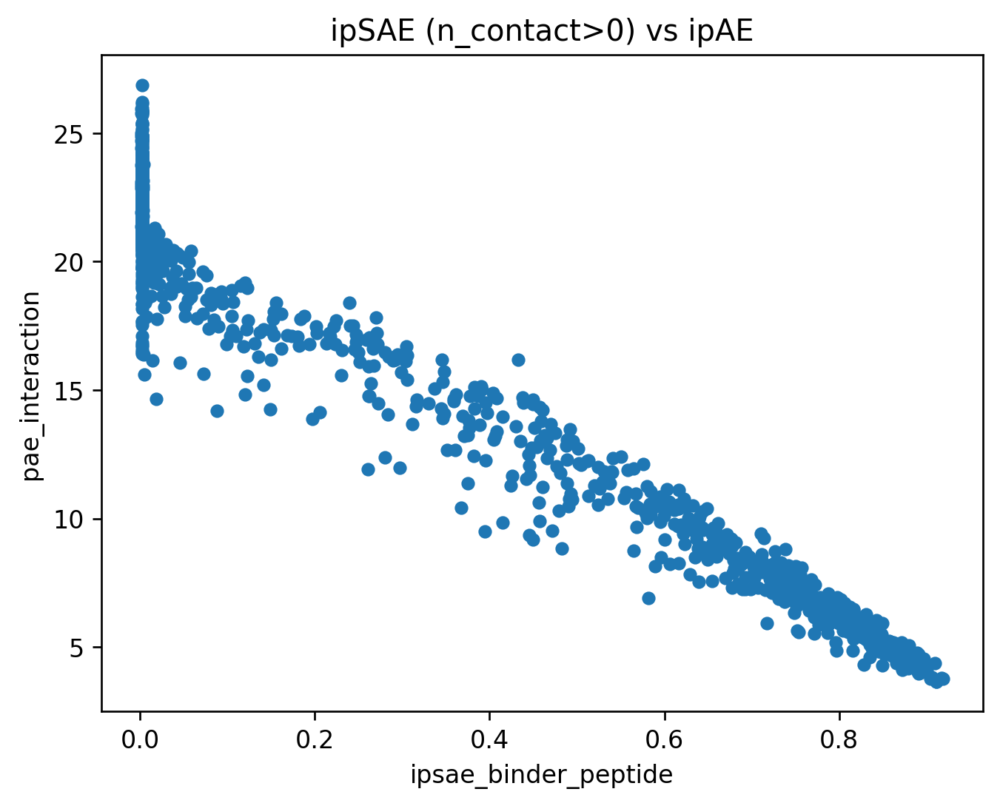

In [17]:
rho, p_value = spearmanr(merged_df['ipsae_binder_peptide'], merged_df['pae_interaction'])
print(f"Spearman: {rho}, p_value={p_value}")
merged_df.plot.scatter(x='ipsae_binder_peptide', y='pae_interaction', title='ipSAE (n_contact>0) vs ipAE')
plt.show()

In [26]:
merged_df.to_csv('/n/groups/marks/users/aaron/pmhc/af_init_guess/outputs/r2/af2_ipae_ipsae_scores.csv')

Spearman: -0.6956163757364118, p_value=5.4218039070309407e-14


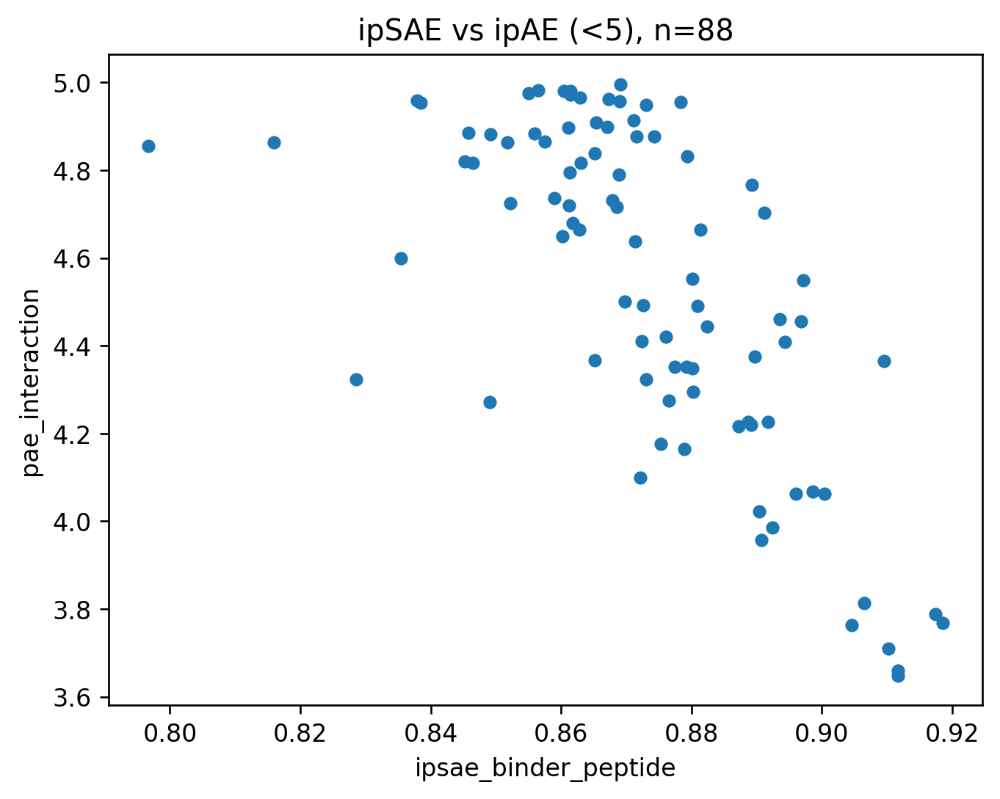

In [20]:
filtered_merged_df = merged_df[merged_df['pae_interaction']<5]
rho, p_value = spearmanr(filtered_merged_df['ipsae_binder_peptide'], filtered_merged_df['pae_interaction'])
print(f"Spearman: {rho}, p_value={p_value}")
filtered_merged_df.plot.scatter(x='ipsae_binder_peptide', y='pae_interaction', title=f"ipSAE vs ipAE (<5), n={len(filtered_merged_df)}")
plt.show()

Spearman: -0.8810356176346397, p_value=5.82387162033355e-66


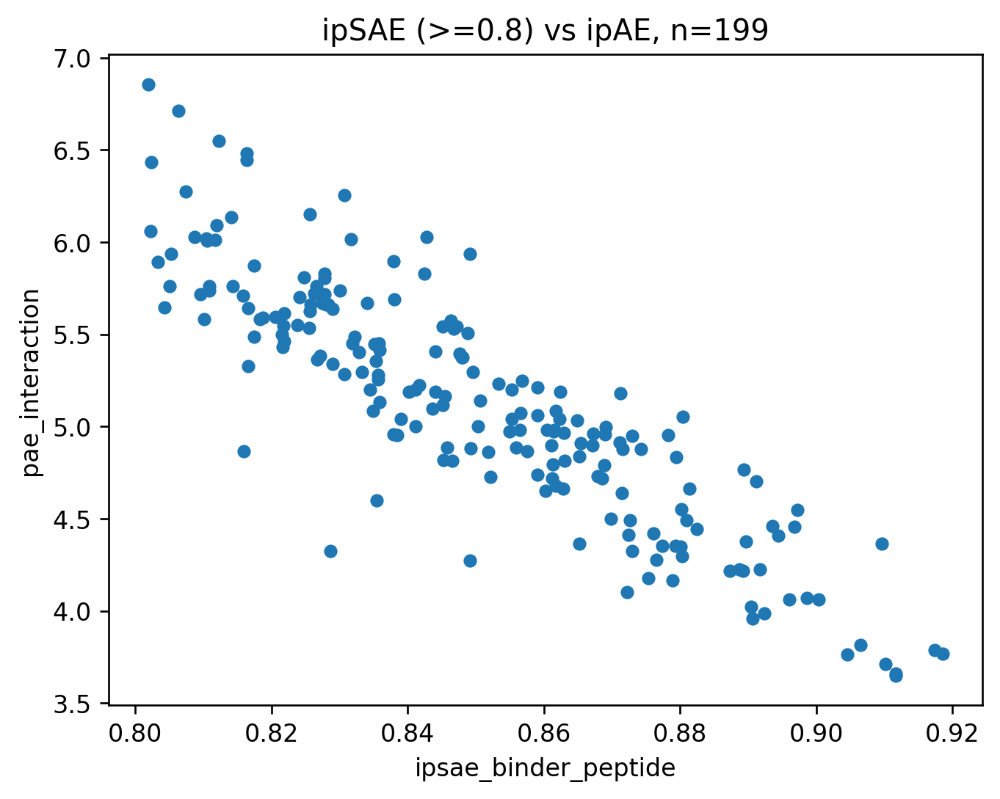

In [19]:
filtered_merged_df = merged_df[merged_df['ipsae_binder_peptide']>=0.8]
rho, p_value = spearmanr(filtered_merged_df['ipsae_binder_peptide'], filtered_merged_df['pae_interaction'])
print(f"Spearman: {rho}, p_value={p_value}")
filtered_merged_df.plot.scatter(x='ipsae_binder_peptide', y='pae_interaction', title=f"ipSAE (>=0.8) vs ipAE, n={len(filtered_merged_df)}")
plt.show()

**Observation:** ipSAE and ipAE aren't as highly correlated in the top designs. 

**Question:** Which one should we use? ipSAE >= 0.8 or ipAE < 5?

**Visualize:**

1. 3D structures
2. Check the sequences

In [21]:
from analyze_af2_scores import view_candidates

In [25]:
pdbs = sorted(glob.glob("/n/groups/marks/users/aaron/pmhc/af_init_guess/outputs/r2/af2_kras/top_pdbs/*.pdb"))
top = pd.read_csv("/n/groups/marks/users/aaron/pmhc/af_init_guess/outputs/r2/af2_kras_passing.csv")
view_candidates(pdbs, top_df=top, cols=3)

Viewing 20 structures  (7 rows × 3 cols)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Manually checked sequences from orient_255_pT12__33:

**What looks good**

**Conserved interface motif.** The region around positions 65–72 is strikingly conserved across nearly all samples — KELGGV, LNQELGGV, LNKELGGV, LGGVAQ variants appear in 7/8 sequences. This is a strong signal that MPNN has identified a specific structural solution for the peptide-contacting region, and it's reproducible across independent samples. That's exactly what you want to see from a good scaffold.
C-terminal AWA motif is conserved in 7/8 samples, again suggesting a structural constraint being reliably satisfied.

**MPNN scores are solid.** Sample scores of 0.94–1.01 at T=0.1 are good. The global score (~1.49–1.53) is higher because it includes chain B (MHC+peptide), which is fixed and not being optimized — the discrepancy between sample score and global score is expected and not a concern.
Reasonable diversity despite T=0.1. The N-terminal halves vary meaningfully across samples in charge patterning and specific residue choices, which means you're getting genuine sequence diversity rather than near-identical copies.

**What to flag**

**Alanine dominance in the N-terminal half.** Samples 1, 2, 5, and 6 are extremely alanine-heavy in positions 1–30 (ATAAAVAAAAAEAER..., ATAALLVAALRALA...). This is the classic poly-G backbone artifact — when MPNN lacks sidechain context and the backbone is geometrically under-constrained, it defaults to alanine as the lowest-energy filler for helical positions. This isn't necessarily wrong (alanine stabilizes helices), but it can indicate those positions aren't making meaningful contacts with the target. Samples 3, 4, 7, and 8 show more charged/specific residues in the N-terminus, which is probably healthier.

**Sample 5 has a free cysteine (STAEEVAALAAQCEA..., position ~12).** Free cysteines are problematic for expression — they can form non-native disulfides, cause aggregation during purification, or interfere with the CAR fusion. This sequence should be deprioritized unless you explicitly want to explore it.
seq_recovery of 0.0538 — only ~5 residues out of 91 are glycine, which is expected since you're designing over a poly-G backbone. This is normal and not a concern.

**Overall verdict**

This is a healthy MPNN output from a productive scaffold. The conserved LGGV/KELGGV interface motif is the most encouraging signal — it suggests MPNN has converged on a specific solution for the peptide contact region that is robust across samples. Samples 3, 7, and 8 are probably the strongest candidates from this set given their more specific (less alanine-dominated) N-terminal sequences alongside the conserved interface motif. Sample 5 should be deprioritized due to the free cysteine. The rest are worth carrying into AF2 initial guess as planned.

Both filters:       87
iPAE only (<5):     1
ipSAE only (≥0.8):  112
Neither:            860


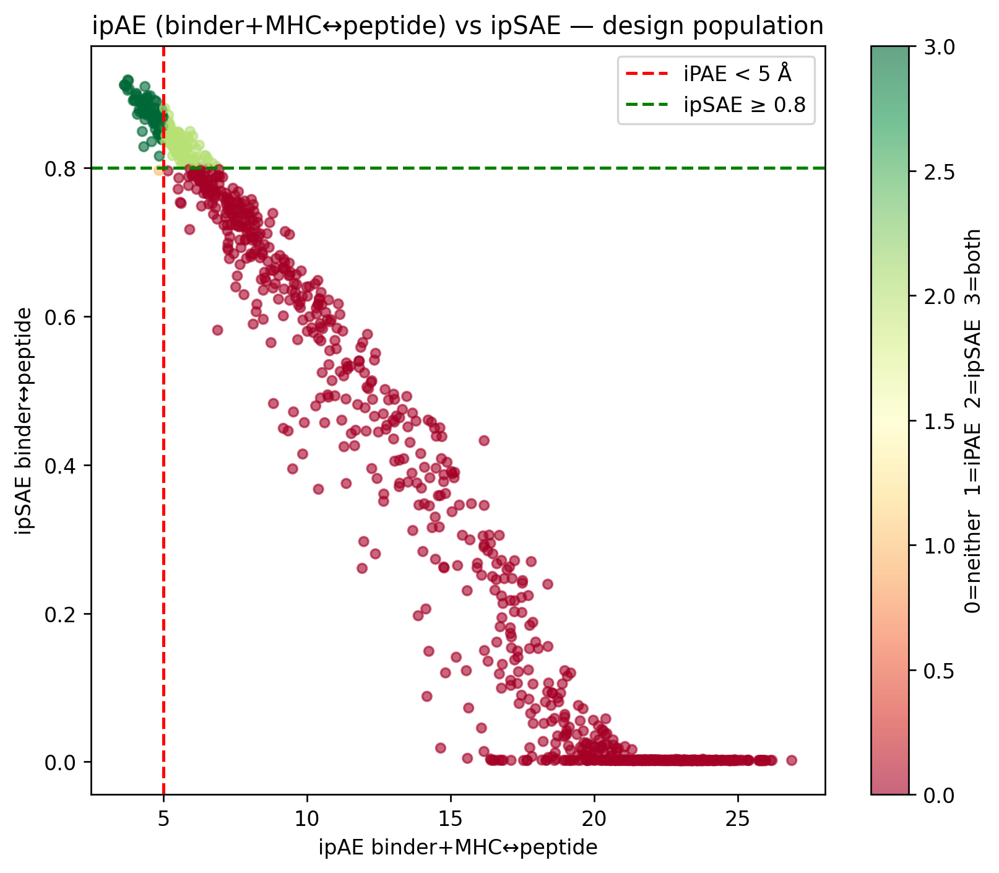

In [31]:
# Classify each design
merged_df['pass_ipae']  = merged_df['pae_interaction']           < 5.0   # iPAE = pae_interaction (same as Science paper authors)
merged_df['pass_ipsae'] = merged_df['ipsae_binder_peptide']  >= 0.8

# Venn-style counts
both      = (merged_df['pass_ipae'] & merged_df['pass_ipsae']).sum()
ipae_only = (merged_df['pass_ipae'] & ~merged_df['pass_ipsae']).sum()
ipsae_only= (~merged_df['pass_ipae'] & merged_df['pass_ipsae']).sum()
neither   = (~merged_df['pass_ipae'] & ~merged_df['pass_ipsae']).sum()

print(f"Both filters:       {both}")
print(f"iPAE only (<5):     {ipae_only}")
print(f"ipSAE only (≥0.8):  {ipsae_only}")
print(f"Neither:            {neither}")

# Scatter plot
fig, ax = plt.subplots(figsize=(7, 6))
sc = ax.scatter(merged_df['pae_interaction'], merged_df['ipsae_binder_peptide'],
                c=merged_df['pass_ipae'].astype(int) + merged_df['pass_ipsae'].astype(int) * 2,
                cmap='RdYlGn', alpha=0.6, s=20)
ax.axvline(5.0, color='red',   linestyle='--', label='iPAE < 5 Å')
ax.axhline(0.8, color='green', linestyle='--', label='ipSAE ≥ 0.8')
ax.set_xlabel('ipAE binder+MHC↔peptide')
ax.set_ylabel('ipSAE binder↔peptide')
ax.set_title('ipAE (binder+MHC↔peptide) vs ipSAE — design population')
ax.legend()
plt.colorbar(sc, ax=ax, label='0=neither  1=iPAE  2=ipSAE  3=both')
plt.tight_layout()
fig

Both filters:       193
iPAE only (<5):     8
ipSAE only (≥0.8):  6
Neither:            853


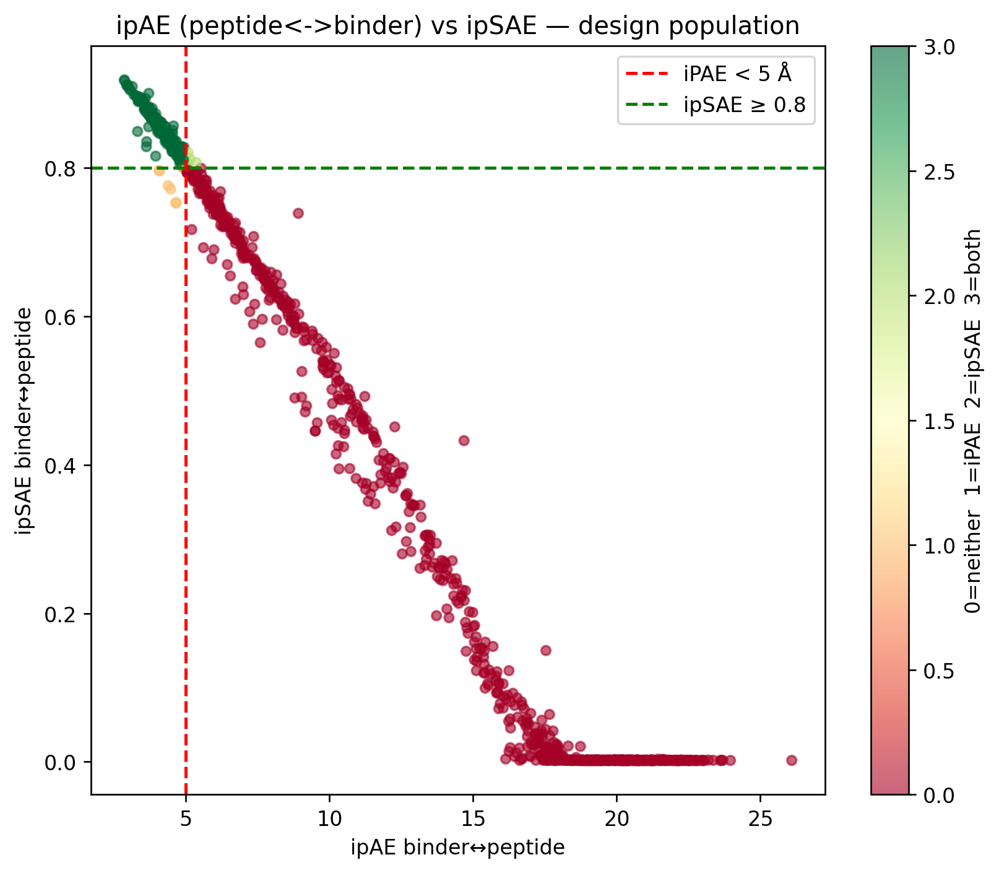

In [30]:
# Classify each design
merged_df['pass_ipae']  = merged_df['mean_pae_bp']           < 5.0   # iPAE = mean_pae_bp (different from Science paper authors)
merged_df['pass_ipsae'] = merged_df['ipsae_binder_peptide']  >= 0.8

# Venn-style counts
both      = (merged_df['pass_ipae'] & merged_df['pass_ipsae']).sum()
ipae_only = (merged_df['pass_ipae'] & ~merged_df['pass_ipsae']).sum()
ipsae_only= (~merged_df['pass_ipae'] & merged_df['pass_ipsae']).sum()
neither   = (~merged_df['pass_ipae'] & ~merged_df['pass_ipsae']).sum()

print(f"Both filters:       {both}")
print(f"iPAE only (<5):     {ipae_only}")
print(f"ipSAE only (≥0.8):  {ipsae_only}")
print(f"Neither:            {neither}")

# Scatter plot
fig, ax = plt.subplots(figsize=(7, 6))
sc = ax.scatter(merged_df['mean_pae_bp'], merged_df['ipsae_binder_peptide'],
                c=merged_df['pass_ipae'].astype(int) + merged_df['pass_ipsae'].astype(int) * 2,
                cmap='RdYlGn', alpha=0.6, s=20)
ax.axvline(5.0, color='red',   linestyle='--', label='iPAE < 5 Å')
ax.axhline(0.8, color='green', linestyle='--', label='ipSAE ≥ 0.8')
ax.set_xlabel('ipAE binder↔peptide')
ax.set_ylabel('ipSAE binder↔peptide')
ax.set_title('ipAE (peptide<->binder) vs ipSAE — design population')
ax.legend()
plt.colorbar(sc, ax=ax, label='0=neither  1=iPAE  2=ipSAE  3=both')
plt.tight_layout()
fig

I'd use the ipSAE > 0.8 backbones